# 03 - DAgger-style dataset aggregation

This notebook tests the thesis that a model trained on rule-based trajectories suffers policy-induced distribution shift, and that aggregating MPC rollouts improves the SINDy surrogate in the part of state-action space actually visited by MPC.

In [1]:
from pathlib import Path
import sys

HERE = Path.cwd().resolve()
if (HERE / 'article_experiment_utils.py').exists():
    ARTICLE_DIR = HERE
    REPO_DIR = HERE.parent
else:
    ARTICLE_DIR = HERE / 'own-article'
    REPO_DIR = HERE
sys.path.insert(0, str(ARTICLE_DIR))
sys.path.insert(0, str(REPO_DIR))

from article_experiment_utils import *
OUT = results_dir()

In [2]:
FAST_MODE = False
cfg = ExperimentConfig(n_days=7 if FAST_MODE else 60, start_date='2010-02-28', horizon=20)
test_cfg = ExperimentConfig(**{**asdict(cfg), 'start_date': '2010-04-15', 'n_days': 3 if FAST_MODE else 30})

train_path = OUT / 'datasets' / ('rbc_train_fast.npz' if FAST_MODE else 'rbc_train_60d.npz')
test_path = OUT / 'datasets' / ('rbc_test_fast.npz' if FAST_MODE else 'rbc_test_30d_2010_04_15.npz')

train_data = load_dataset(train_path) if train_path.exists() else collect_rule_based_dataset(cfg)
test_data = load_dataset(test_path) if test_path.exists() else collect_rule_based_dataset(test_cfg, start_date=test_cfg.start_date)
save_dataset(train_data, train_path)
save_dataset(test_data, test_path)

In [3]:
iterations = 1 if FAST_MODE else 3
episode_days = 1 if FAST_MODE else 5

dagger_metrics, dagger_bundles, dagger_datasets = run_dagger(
    train_data,
    test_data,
    cfg,
    iterations=iterations,
    episode_days=episode_days,
    feature_variant='physics',
)

for i, bundle in enumerate(dagger_bundles):
    save_bundle(bundle, OUT / 'models' / (f'dagger_iter_{i}_fast.pkl' if FAST_MODE else f'dagger_iter_{i}.pkl'))

for i, data in enumerate(dagger_datasets):
    save_dataset(data, OUT / 'datasets' / (f'dagger_dataset_part_{i}_fast.npz' if FAST_MODE else f'dagger_dataset_part_{i}.npz'))

save_table(dagger_metrics, OUT / 'tables' / ('dagger_metrics_fast.csv' if FAST_MODE else 'dagger_metrics.csv'))
dagger_metrics.head()

C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\pysindy\__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound


C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(



******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality c

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.8624266e+02 2.65e+00 1.61e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   9  6.3223639e+01 9.67e-04 4.47e-05  -3.8 7.60e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.3214909e+01 3.81e-04 1.09e-02  -5.7 4.09e-02    -  9.95e-01 8.54e-01h  1
  11  6.3213588e+01 8.87e-05 7.02e-03  -5.7 1.41e-02    -  1.00e+00 8.95e-01h  1
  12  6.3213434e+01 4.19e-06 1.91e-07  -5.7 3.65e-03    -  1.00e+00 1.00e+00f  1
  13  6.3213324e+01 3.82e-07 4.80e-04  -8.6 7.90e-04    -  1.00e+00 9.40e-01h  1
  14  6.3213317e+01 9.00e-10 2.40e-11  -8.6 5.98e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   6.3213317402802652e+01    6.3213317402802652e+01
Dual infeasibility......:   2.4018564914740637e-11    2.4018564914740637e-11
Constraint violation....:   2.5103194143335456e-10    8.9971763372886936e-10
Variable bound violation:   9.8740136271772413e-09    9.8740136271772413e-09
Complementarity........

   8  3.7590017e+02 1.01e-08 1.35e-08  -5.7 4.44e-03    -  1.00e+00 1.00e+00h  1
   9  3.7590004e+02 3.96e-11 2.34e-11  -8.6 1.77e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   3.7590003624160022e+02    3.7590003624160022e+02
Dual infeasibility......:   2.3373155595693483e-11    2.3373155595693483e-11
Constraint violation....:   1.2032534954725086e-11    3.9563019527122378e-11
Variable bound violation:   9.9225716532203023e-09    9.9225716532203023e-09
Complementarity.........:   2.7319089250984953e-09    2.7319089250984953e-09
Overall NLP error.......:   2.7319089250984953e-09    2.7319089250984953e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 10
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian eva

   3  6.7233352e+02 8.96e-01 4.83e+01  -1.0 9.13e+00    -  1.00e+00 6.22e-01h  1
   4  6.8871289e+02 1.15e-02 1.03e-01  -1.0 3.58e+00    -  1.00e+00 1.00e+00h  1
   5  6.8160134e+02 1.13e-02 4.95e-01  -2.5 2.33e+00    -  8.89e-01 9.73e-01f  1
   6  6.8101579e+02 1.87e-03 1.85e-03  -2.5 1.63e+00    -  1.00e+00 1.00e+00f  1
   7  6.8074338e+02 4.63e-04 6.00e-02  -3.8 8.93e-01    -  9.48e-01 1.00e+00f  1
   8  6.8073200e+02 9.02e-05 5.26e-05  -3.8 4.14e-01    -  1.00e+00 1.00e+00h  1
   9  6.8071812e+02 2.43e-05 4.34e-03  -5.7 2.13e-01    -  9.70e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.8071786e+02 4.75e-06 9.01e-07  -5.7 9.17e-02    -  1.00e+00 1.00e+00h  1
  11  6.8071784e+02 8.27e-07 1.60e-07  -5.7 4.14e-02    -  1.00e+00 1.00e+00h  1
  12  6.8071768e+02 8.20e-08 2.38e-05  -8.6 1.66e-02    -  9.98e-01 1.00e+00h  1
  13  6.8071768e+02 1.29e-09 3.34e-10  -8.6 3.12e-03    -  1.00e+00 1.00e+00h  1
  14  6.8071768e+02 1.93e-12

   5  5.7448270e+02 1.53e-04 6.34e-04  -1.0 7.32e-01    -  1.00e+00 1.00e+00h  1
   6  5.6763534e+02 6.23e-03 4.14e-01  -2.5 1.84e+00    -  9.20e-01 1.00e+00f  1
   7  5.6743275e+02 9.69e-04 2.23e-04  -2.5 9.65e-01    -  1.00e+00 1.00e+00f  1
   8  5.6722475e+02 3.62e-04 6.54e-05  -3.8 5.57e-01    -  1.00e+00 1.00e+00f  1
   9  5.6722251e+02 3.79e-05 1.03e-05  -3.8 1.91e-01    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.6721136e+02 9.42e-06 2.41e-06  -5.7 5.00e-02    -  1.00e+00 1.00e+00f  1
  11  5.6721136e+02 6.97e-07 1.96e-07  -5.7 1.02e-02    -  1.00e+00 1.00e+00h  1
  12  5.6721122e+02 8.84e-09 2.41e-09  -8.6 1.24e-03    -  1.00e+00 1.00e+00h  1
  13  5.6721122e+02 9.09e-13 2.46e-13  -8.6 1.16e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   5.6721122053981446e+02    5.6721122053981446e+02
Dual infeas

   6  2.7125217e+02 4.24e-03 2.66e-02  -2.5 1.77e+00    -  1.00e+00 9.81e-01f  1
   7  2.7105541e+02 7.73e-04 1.15e-01  -3.8 9.67e-01    -  9.93e-01 8.75e-01f  1
   8  2.7102242e+02 1.43e-04 8.25e-05  -3.8 4.48e-01    -  1.00e+00 1.00e+00f  1
   9  2.7101085e+02 2.44e-05 7.13e-03  -5.7 1.25e-01    -  1.00e+00 9.62e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.7101026e+02 4.25e-06 7.39e-03  -5.7 1.58e-02    -  1.00e+00 9.27e-01f  1
  11  2.7101021e+02 6.86e-07 1.54e-07  -5.7 2.45e-03    -  1.00e+00 1.00e+00f  1
  12  2.7101008e+02 1.58e-07 4.80e-04  -8.6 1.14e-03    -  1.00e+00 9.81e-01h  1
  13  2.7101007e+02 2.22e-08 5.22e-09  -8.6 4.51e-04    -  1.00e+00 1.00e+00f  1
  14  2.7101007e+02 8.10e-10 1.91e-10  -8.6 8.62e-05    -  1.00e+00 1.00e+00h  1
  15  2.7101007e+02 2.16e-12 4.21e-13  -9.0 3.99e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objecti

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.5240839e+01 1.99e+01 1.75e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   3  4.8489883e+02 2.22e+00 6.28e-01  -1.0 1.16e+02    -  1.00e+00 9.96e-01f  1
   4  4.7793040e+02 4.65e-02 7.61e-02  -1.7 2.06e+00    -  1.00e+00 9.77e-01f  1
   5  4.7650334e+02 5.55e-03 2.40e-01  -2.5 9.44e-01    -  1.00e+00 8.81e-01f  1
   6  4.7629327e+02 4.48e-04 7.14e-04  -2.5 2.47e-01    -  1.00e+00 1.00e+00f  1
   7  4.7610550e+02 1.35e-04 3.96e-02  -3.8 1.24e-01    -  1.00e+00 9.49e-01f  1
   8  4.7609464e+02 2.00e-05 4.05e-05  -3.8 4.39e-02    -  1.00e+00 1.00e+00f  1
   9  4.7608370e+02 1.77e-06 2.79e-04  -5.7 1.91e-02    -  1.00e+00 9.98e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.7608365e+02 8.27e-09 9.02e-08  -5.7 2.21e-03    -  1.00e+00 1.00e+00f  1
  11  4.7608352e+02 1.24e-10 6.76e-10  -8.6 1.99e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   4.7608351698708094e+02    4.7608351698708094e+02
Dual infeas

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  9.7096130e+02 2.05e-05 2.83e-03  -5.7 1.64e-01    -  9.80e-01 1.00e+00f  1
  11  9.7096119e+02 4.31e-06 1.19e-06  -5.7 7.38e-02    -  1.00e+00 1.00e+00h  1
  12  9.7096119e+02 5.30e-07 1.51e-07  -5.7 2.56e-02    -  1.00e+00 1.00e+00h  1
  13  9.7096103e+02 2.92e-08 8.64e-09  -8.6 6.02e-03    -  1.00e+00 1.00e+00h  1
  14  9.7096103e+02 4.23e-11 1.21e-11  -8.6 2.29e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   9.7096102952756769e+02    9.7096102952756769e+02
Dual infeasibility......:   1.2053601648260028e-11    1.2053601648260028e-11
Constraint violation....:   1.0396323392467651e-11    4.2291503632441163e-11
Variable bound violation:   9.9853003394779817e-09    9.9853003394779817e-09
Complementarity.........:   2.7534703383709992e-09    2.7534703383709992e-09
Overall NLP error.......:  

   8  1.0330302e+03 5.60e-04 5.20e-04  -2.5 1.18e+00    -  1.00e+00 1.00e+00f  1
   9  1.0327900e+03 9.49e-05 3.89e-05  -3.8 3.83e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.0327876e+03 1.81e-05 1.02e-05  -3.8 1.50e-01    -  1.00e+00 1.00e+00h  1
  11  1.0327746e+03 2.30e-06 1.17e-06  -5.7 5.33e-02    -  1.00e+00 1.00e+00f  1
  12  1.0327746e+03 3.05e-08 1.74e-08  -5.7 6.07e-03    -  1.00e+00 1.00e+00h  1
  13  1.0327744e+03 1.04e-10 4.77e-11  -8.6 3.65e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   1.0327744299874471e+03    1.0327744299874471e+03
Dual infeasibility......:   4.7696533187133725e-11    4.7696533187133725e-11
Constraint violation....:   2.6996877566639306e-11    1.0436451702844352e-10
Variable bound violation:   9.9851111062582173e-09    9.9851111062582173e-09
Complementarity........

  13  3.6030281e+02 8.72e-06 1.75e-06  -5.7 4.28e-03    -  1.00e+00 1.00e+00f  1
  14  3.6030280e+02 5.17e-07 6.78e-08  -5.7 1.34e-03    -  1.00e+00 1.00e+00h  1
  15  3.6030266e+02 7.15e-08 3.45e-06  -8.6 4.65e-04    -  1.00e+00 9.99e-01h  1
  16  3.6030266e+02 4.78e-10 6.07e-11  -8.6 4.07e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   3.6030266026348505e+02    3.6030266026348505e+02
Dual infeasibility......:   6.0715432681490711e-11    6.0715432681490711e-11
Constraint violation....:   1.4681790673774552e-10    4.7793946578167379e-10
Variable bound violation:   9.9716678193038146e-09    9.9716678193038146e-09
Complementarity.........:   6.1099437494287814e-09    6.1099437494287814e-09
Overall NLP error.......:   6.1099437494287814e-09    6.1099437494287814e-09


Number of objective function evaluations             = 17
Number of objective gradient evaluations            

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  8.7510286e+01 1.22e+01 1.55e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  8.5667928e+01 1.12e+01 8.44e+00  -1.0 1.22e+01    -  6.66e-01 8.56e-02h  1
   2  1.0556056e+02 8.33e-01 4.14e+00  -1.0 1.12e+01    -  8.42e-01 1.00e+00h  1
   3  1.0313241e+02 2.17e-01 1.53e-01  -1.0 3.16e+00    -  1.00e+00 1.00e+00f  1
   4  9.8154520e+0

   8  4.3877153e+02 7.89e-08 1.03e-07  -5.7 1.58e-02    -  1.00e+00 1.00e+00h  1
   9  4.3877139e+02 6.59e-11 7.14e-11  -8.6 3.03e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   4.3877138538347191e+02    4.3877138538347191e+02
Dual infeasibility......:   7.1362746902949861e-11    7.1362746902949861e-11
Constraint violation....:   2.0049762198682918e-11    6.5938365878537297e-11
Variable bound violation:   9.9239572115550345e-09    9.9239572115550345e-09
Complementarity.........:   2.9651081193027122e-09    2.9651081193027122e-09
Overall NLP error.......:   2.9651081193027122e-09    2.9651081193027122e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 10
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian eva

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.0913571e+02 2.96e+00 1.46e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.5633483e+02 1.44e+00 1.52e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.5547152e+01 1.28e+01 1.56e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.2800136e+02 2.09e+02 1.54e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  3.0416106e+02 1.92e+02 1.21e+01  -1.0 2.09e+02    -  2.67e-01 8.47e-02f  1
   2  1.5236758e+02 4.89e+00 4.69e+00  -1.0 1.92e+02    -  6.96e-01 1.00e+00f  1
   3  1.4806338e+02 2.09e-02 1.40e+00  -1.0 1.02e+00    -  6.90e-01 1.00e+00f  1
   4  1.4864976e+0

   7  7.8391022e+02 3.46e-05 8.68e-06  -3.8 3.51e-02    -  1.00e+00 1.00e+00h  1
   8  7.8389611e+02 2.82e-06 6.38e-07  -5.7 1.02e-02    -  1.00e+00 1.00e+00f  1
   9  7.8389607e+02 4.42e-09 2.48e-09  -5.7 8.01e-04    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  7.8389590e+02 1.40e-10 2.82e-11  -8.6 9.07e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objective...............:   7.8389590251125765e+02    7.8389590251125765e+02
Dual infeasibility......:   2.8208589208656961e-11    2.8208589208656961e-11
Constraint violation....:   4.2355592660164638e-11    1.3960743672214448e-10
Variable bound violation:   9.9778828435076049e-09    9.9778828435076049e-09
Complementarity.........:   3.6786606376652820e-09    3.6786606376652820e-09
Overall NLP error.......:   3.6786606376652820e-09    3.6786606376652820e-09


Number of objective function 

   2  8.5579289e+02 2.63e+00 6.20e+01  -1.0 4.76e+01    -  4.78e-01 4.63e-02f  1
   3  8.7783373e+02 1.47e+00 8.23e+01  -1.0 5.89e+00    -  9.90e-01 4.42e-01h  1
   4  9.1312685e+02 4.87e-02 2.61e-01  -1.0 4.44e+00    -  1.00e+00 1.00e+00h  1
   5  9.0692238e+02 5.64e-03 6.65e-03  -1.7 2.06e+00    -  9.99e-01 1.00e+00f  1
   6  9.0537039e+02 8.80e-04 3.66e-04  -2.5 1.21e+00    -  1.00e+00 1.00e+00f  1
   7  9.0512185e+02 9.53e-05 4.38e-05  -3.8 3.98e-01    -  1.00e+00 1.00e+00f  1
   8  9.0511775e+02 9.42e-06 5.49e-06  -3.8 1.05e-01    -  1.00e+00 1.00e+00h  1
   9  9.0510535e+02 2.40e-07 9.15e-08  -5.7 1.71e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  9.0510519e+02 1.42e-10 6.45e-11  -8.6 4.04e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objective...............:   9.0510518875176774e+02    9.0510518875176774e+02
Dual infeas

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.2727199e+02 6.55e+00 1.96e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   5  7.3558469e+01 1.52e-02 1.09e-02  -1.7 1.05e+00    -  1.00e+00 1.00e+00h  1
   6  7.2433158e+01 1.56e-02 9.35e-02  -3.8 9.67e-01    -  9.62e-01 8.57e-01f  1
   7  7.2256015e+01 7.39e-03 2.24e-01  -3.8 4.60e-01    -  1.00e+00 7.83e-01f  1
   8  7.2208875e+01 2.19e-03 6.23e-02  -3.8 2.10e-01    -  1.00e+00 9.41e-01h  1
   9  7.2205308e+01 2.04e-04 5.87e-05  -3.8 5.18e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  7.2196796e+01 7.65e-05 9.74e-03  -5.7 3.54e-02    -  1.00e+00 9.38e-01h  1
  11  7.2196262e+01 5.20e-06 1.33e-06  -5.7 7.31e-03    -  1.00e+00 1.00e+00h  1
  12  7.2196155e+01 2.17e-07 1.97e-04  -8.6 1.09e-03    -  1.00e+00 9.89e-01h  1
  13  7.2196154e+01 5.32e-10 4.41e-10  -8.6 8.49e-05    -  1.00e+00 1.00e+00f  1
  14  7.2196154e+01 5.68e-13 1.11e-13  -8.6 1.96e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objecti

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.0128095e+02 1.08e+01 1.50e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.1572514e+02 3.21e+00 1.49e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.3868533e+03 1.86e+01 2.70e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.4896315e+02 8.58e-08 3.01e-07  -5.7 4.59e-02    -  1.00e+00 1.00e+00f  1
  11  2.4896300e+02 1.10e-08 8.23e-05  -8.6 1.54e-02    -  1.00e+00 9.89e-01h  1
  12  2.4896299e+02 3.15e-10 1.05e-09  -8.6 2.69e-03    -  1.00e+00 1.00e+00f  1
  13  2.4896299e+02 4.55e-13 8.98e-13  -8.6 7.49e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   2.4896299253467686e+02    2.4896299253467686e+02
Dual infeasibility......:   8.9804516532046640e-13    8.9804516532046640e-13
Constraint violation....:   1.3780585961954822e-13    4.5474735088646412e-13
Variable bound violation:   9.9713528009965760e-09    9.9713528009965760e-09
Complementarity.........:   2.5454758076917326e-09    2.5454758076917326e-09
Overall NLP error.......:   2.5454758076917326e-09    2.5454758076917326e-09


Number of objective function 

   1  1.6140975e+02 8.07e+00 5.17e+00  -1.0 9.99e+00    -  9.91e-01 1.92e-01h  1
   2  1.7678064e+02 5.45e-02 3.67e-02  -1.0 8.07e+00    -  1.00e+00 1.00e+00h  1
   3  1.7286511e+02 1.36e-03 1.17e-01  -2.5 5.47e-01    -  8.56e-01 9.86e-01f  1
   4  1.7224912e+02 1.75e-04 2.37e-04  -2.5 1.62e-01    -  1.00e+00 1.00e+00f  1
   5  1.7210679e+02 7.03e-05 4.60e-02  -3.8 8.54e-02    -  1.00e+00 8.87e-01f  1
   6  1.7208648e+02 1.73e-05 3.33e-06  -3.8 4.49e-02    -  1.00e+00 1.00e+00f  1
   7  1.7207817e+02 3.01e-06 1.04e-02  -5.7 1.66e-02    -  1.00e+00 9.40e-01f  1
   8  1.7207755e+02 1.12e-07 8.95e-08  -5.7 3.24e-03    -  1.00e+00 1.00e+00f  1
   9  1.7207743e+02 1.71e-09 3.19e-05  -8.6 3.16e-04    -  1.00e+00 9.97e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.7207743e+02 2.73e-12 9.12e-12  -8.6 1.29e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objecti

   1  5.7762021e+02 2.86e+00 1.32e+01  -1.0 2.67e+01    -  9.56e-02 2.88e-02f  1
   2  5.7508531e+02 2.64e+00 8.18e+01  -1.0 1.07e+01    -  7.83e-01 7.44e-02f  1
   3  6.0047331e+02 1.14e+00 2.57e+01  -1.0 2.74e+01    -  3.65e-01 5.71e-01h  1
   4  6.2170369e+02 4.66e-02 2.77e-01  -1.0 1.75e+01    -  1.00e+00 1.00e+00h  1
   5  6.1644781e+02 7.17e-03 1.16e+00  -1.7 3.03e+00    -  7.05e-01 1.00e+00f  1
   6  6.1589006e+02 1.34e-04 5.59e-04  -1.7 3.06e-01    -  1.00e+00 1.00e+00f  1
   7  6.1447942e+02 8.44e-04 2.32e-01  -2.5 5.22e-01    -  8.81e-01 1.00e+00f  1
   8  6.1446141e+02 1.71e-05 1.36e-04  -2.5 5.08e-01    -  1.00e+00 1.00e+00h  1
   9  6.1425896e+02 3.34e-05 2.57e-02  -3.8 4.01e-01    -  1.00e+00 9.49e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.1424840e+02 4.02e-07 2.19e-05  -3.8 1.68e-01    -  1.00e+00 1.00e+00f  1
  11  6.1423733e+02 1.25e-07 3.50e-03  -5.7 8.11e-02    -  1.00e+00 9.44e-01f  1
  12  6.1423669e+02 7.57e-09

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  7.5052152e+02 6.94e-07 4.60e-05  -3.8 3.33e-01    -  1.00e+00 1.00e+00f  1
  11  7.5051096e+02 1.89e-07 1.76e-02  -5.7 1.76e-01    -  1.00e+00 8.83e-01f  1
  12  7.5050956e+02 1.36e-08 6.16e-06  -5.7 1.02e-01    -  1.00e+00 1.00e+00f  1
  13  7.5050955e+02 6.46e-10 1.35e-06  -5.7 3.79e-02    -  1.00e+00 1.00e+00h  1
  14  7.5050941e+02 2.79e-10 2.46e-05  -8.6 1.91e-02    -  9.90e-01 9.91e-01f  1
  15  7.5050941e+02 3.82e-11 1.42e-07  -8.6 9.32e-03    -  1.00e+00 1.00e+00f  1
  16  7.5050941e+02 8.07e-12 2.94e-08  -8.6 4.24e-03    -  1.00e+00 1.00e+00h  1
  17  7.5050941e+02 7.96e-13 3.48e-09  -8.6 1.46e-03    -  1.00e+00 1.00e+00h  1
  18  7.5050941e+02 4.55e-13 1.13e-10  -9.0 2.63e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 18

                                   (scaled)                 (unscaled)
Objective...............:   7.5050940643871638e+02    7.5050940643871638e+02
Dual infeas

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  5.9688836e+02 1.76e+00 1.39e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.9979210e+02 1.01e+01 1.32e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  11  4.7207216e+01 2.54e-08 5.60e-09  -5.7 7.13e-04    -  1.00e+00 1.00e+00f  1
  12  4.7207109e+01 2.46e-09 7.06e-10  -8.6 1.38e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   4.7207109400377576e+01    4.7207109400377576e+01
Dual infeasibility......:   7.0638654238391961e-10    7.0638654238391961e-10
Constraint violation....:   7.0526032243182330e-10    2.4591599867562763e-09
Variable bound violation:   9.8769496284717157e-09    9.8769496284717157e-09
Complementarity.........:   6.9997483318485611e-09    6.9997483318485611e-09
Overall NLP error.......:   6.9997483318485611e-09    6.9997483318485611e-09


Number of objective function evaluations             = 13
Number of objective gradient evaluations             = 13
Number of equality constraint evaluations            = 13
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian ev

  12  6.2826001e+02 6.14e-12 2.24e-10  -8.6 5.86e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   6.2826000557539487e+02    6.2826000557539487e+02
Dual infeasibility......:   2.2372309876000858e-10    2.2372309876000858e-10
Constraint violation....:   1.9296055405069527e-12    6.1390892369672656e-12
Variable bound violation:   9.9836871603780981e-09    9.9836871603780981e-09
Complementarity.........:   3.8125715664858402e-09    3.8125715664858402e-09
Overall NLP error.......:   3.8125715664858402e-09    3.8125715664858402e-09


Number of objective function evaluations             = 13
Number of objective gradient evaluations             = 13
Number of equality constraint evaluations            = 13
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 13
Number of inequality constraint Jacobian evaluations = 0
Number 

   8  1.1399345e+03 7.01e-06 8.05e-02  -3.8 5.85e-01    -  1.00e+00 8.13e-01f  1
   9  1.1398943e+03 8.44e-07 6.32e-05  -3.8 3.01e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.1398829e+03 9.87e-08 3.44e-03  -5.7 7.15e-02    -  1.00e+00 9.45e-01f  1
  11  1.1398822e+03 4.22e-10 9.40e-08  -5.7 8.53e-03    -  1.00e+00 1.00e+00f  1
  12  1.1398821e+03 4.55e-12 2.68e-10  -8.6 4.73e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   1.1398820562791493e+03    1.1398820562791493e+03
Dual infeasibility......:   2.6776691902903816e-10    2.6776691902903816e-10
Constraint violation....:   1.4085591403523562e-12    4.5474735088646412e-12
Variable bound violation:   9.9860345428268083e-09    9.9860345428268083e-09
Complementarity.........:   3.8084776286118425e-09    3.8084776286118425e-09
Overall NLP error.......:  

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1069036e+03 3.64e+00 2.18e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   1  4.2826975e+02 4.17e+00 1.54e+01  -1.0 2.20e+01    -  1.24e-01 3.07e-02f  1
   2  4.1967394e+02 3.80e+00 7.75e+01  -1.0 1.07e+01    -  7.08e-01 8.98e-02f  1
   3  3.7569543e+02 8.98e-01 5.18e+00  -1.0 5.14e+00    -  9.01e-01 1.00e+00f  1
   4  3.7576265e+02 1.06e-02 2.16e-02  -1.0 1.53e+00    -  1.00e+00 1.00e+00f  1
   5  3.7057333e+02 2.96e-02 5.38e-01  -2.5 9.61e-01    -  8.13e-01 9.95e-01f  1
   6  3.6984126e+02 6.88e-03 5.14e-03  -2.5 7.08e-01    -  1.00e+00 9.96e-01f  1
   7  3.6965907e+02 4.57e-04 3.13e-02  -3.8 3.23e-01    -  1.00e+00 9.58e-01f  1
   8  3.6964760e+02 1.65e-05 1.12e-05  -3.8 3.96e-02    -  1.00e+00 1.00e+00f  1
   9  3.6963710e+02 2.06e-06 1.51e-04  -5.7 7.86e-03    -  1.00e+00 9.99e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.6963702e+02 2.70e-08 7.71e-09  -5.7 7.86e-04    -  1.00e+00 1.00e+00f  1
  11  3.6963690e+02 2.68e-10 8.05e-11  -8.6 8.60e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

   4  1.9343794e+02 2.48e-03 1.70e-01  -2.5 4.51e-01    -  1.00e+00 9.99e-01f  1
   5  1.9340185e+02 3.33e-04 2.62e-04  -2.5 1.77e-01    -  1.00e+00 1.00e+00f  1
   6  1.9324725e+02 5.88e-05 1.01e-02  -3.8 8.13e-02    -  1.00e+00 9.89e-01f  1
   7  1.9324422e+02 2.76e-06 1.97e-05  -3.8 2.85e-02    -  1.00e+00 1.00e+00f  1
   8  1.9323551e+02 8.26e-07 2.87e-03  -5.7 1.58e-02    -  1.00e+00 9.84e-01f  1
   9  1.9323532e+02 8.59e-09 1.32e-07  -5.7 8.52e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.9323531e+02 3.19e-09 3.66e-09  -5.7 4.01e-03    -  1.00e+00 1.00e+00h  1
  11  1.9323520e+02 8.80e-10 6.73e-06  -8.6 2.34e-03    -  1.00e+00 9.97e-01f  1
  12  1.9323520e+02 2.70e-10 3.06e-10  -8.6 1.16e-03    -  1.00e+00 1.00e+00f  1
  13  1.9323520e+02 5.89e-11 6.71e-11  -8.6 5.43e-04    -  1.00e+00 1.00e+00h  1
  14  1.9323520e+02 9.09e-12 1.04e-11  -8.6 2.13e-04    -  1.00e+00 1.00e+00h  1
  15  1.9323520e+02 9.09e-13

   7  6.8492407e+02 1.93e-03 3.30e-01  -2.5 1.67e+00    -  1.00e+00 8.18e-01f  1
   8  6.8477505e+02 1.05e-04 1.19e-03  -2.5 1.17e+00    -  1.00e+00 1.00e+00f  1
   9  6.8458465e+02 3.65e-05 5.01e-02  -3.8 4.93e-01    -  1.00e+00 8.70e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.8455719e+02 7.76e-07 6.61e-05  -3.8 2.96e-01    -  1.00e+00 1.00e+00f  1
  11  6.8454533e+02 1.03e-07 9.20e-04  -5.7 7.89e-02    -  1.00e+00 9.80e-01f  1
  12  6.8454510e+02 1.19e-10 2.37e-08  -5.7 5.76e-03    -  1.00e+00 1.00e+00f  1
  13  6.8454495e+02 1.35e-11 2.59e-10  -8.6 6.13e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   6.8454494831256966e+02    6.8454494831256966e+02
Dual infeasibility......:   2.5945713714439420e-10    2.5945713714439420e-10
Constraint violation....:   4.1258067514726060e-12    1.3528733688872309e-11
Variable bound viol

  16  6.6348199e+02 1.05e-11 3.39e-08  -8.6 4.58e-03    -  1.00e+00 1.00e+00h  1
  17  6.6348199e+02 1.02e-12 3.43e-09  -8.6 1.46e-03    -  1.00e+00 1.00e+00h  1
  18  6.6348199e+02 5.68e-13 7.91e-11  -9.0 2.21e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 18

                                   (scaled)                 (unscaled)
Objective...............:   6.6348199132037769e+02    6.6348199132037769e+02
Dual infeasibility......:   7.9111203465180477e-11    7.9111203465180477e-11
Constraint violation....:   1.4433374690574282e-13    5.6843418860808015e-13
Variable bound violation:   9.9934401952396006e-09    9.9934401952396006e-09
Complementarity.........:   1.0964934440209182e-09    1.0964934440209182e-09
Overall NLP error.......:   1.0964934440209182e-09    1.0964934440209182e-09


Number of objective function evaluations             = 19
Number of objective gradient evaluations             = 19
Number of equality constraint evaluations            = 19
Number of inequal

  13  7.3639897e+02 1.67e-09 8.67e-07  -5.7 4.39e-02    -  1.00e+00 1.00e+00h  1
  14  7.3639882e+02 7.03e-10 2.67e-04  -8.6 2.46e-02    -  9.96e-01 9.84e-01f  1
  15  7.3639882e+02 1.27e-10 6.53e-08  -8.6 1.21e-02    -  1.00e+00 1.00e+00f  1
  16  7.3639882e+02 1.86e-11 9.75e-09  -8.6 4.66e-03    -  1.00e+00 1.00e+00h  1
  17  7.3639882e+02 7.96e-13 4.74e-10  -8.6 1.03e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 17

                                   (scaled)                 (unscaled)
Objective...............:   7.3639882057414991e+02    7.3639882057414991e+02
Dual infeasibility......:   4.7372160298735243e-10    4.7372160298735243e-10
Constraint violation....:   2.3454512225965661e-13    7.9580786405131221e-13
Variable bound violation:   9.9812737694493461e-09    9.9812737694493461e-09
Complementarity.........:   5.3547651883743572e-09    5.3547651883743572e-09
Overall NLP error.......:   5.3547651883743572e-09    5.3547651883743572e-09


Number of objective function 

   8  5.7091448e+02 8.13e-05 1.05e-01  -3.8 1.29e-01    -  1.00e+00 9.06e-01f  1
   9  5.7089469e+02 2.56e-05 8.19e-05  -3.8 3.96e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.7088403e+02 6.70e-06 7.29e-03  -5.7 1.84e-02    -  1.00e+00 9.73e-01f  1
  11  5.7088361e+02 5.40e-07 1.79e-06  -5.7 4.81e-03    -  1.00e+00 1.00e+00f  1
  12  5.7088347e+02 6.60e-09 4.68e-05  -8.6 6.15e-04    -  9.97e-01 1.00e+00h  1
  13  5.7088347e+02 2.05e-12 1.18e-10  -8.6 2.16e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   5.7088346509930579e+02    5.7088346509930579e+02
Dual infeasibility......:   1.1816049601155810e-10    1.1816049601155810e-10
Constraint violation....:   8.9528384705772623e-13    2.0463630789890885e-12
Variable bound violation:   9.9852223581097254e-09    9.9852223581097254e-09
Complementarity........

   4  5.7099649e+01 4.79e-02 1.62e-01  -1.7 4.96e-01    -  1.00e+00 9.14e-01f  1
   5  5.5577230e+01 8.33e-03 1.03e-02  -2.5 3.27e-01    -  1.00e+00 1.00e+00f  1
   6  5.5394576e+01 1.17e-03 7.38e-02  -3.8 1.25e-01    -  1.00e+00 9.20e-01f  1
   7  5.5376395e+01 8.01e-05 8.05e-05  -3.8 3.75e-02    -  1.00e+00 1.00e+00h  1
   8  5.5367219e+01 7.91e-06 2.57e-03  -5.7 1.71e-02    -  1.00e+00 9.78e-01h  1
   9  5.5366902e+01 8.52e-08 9.58e-08  -5.7 4.43e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.5366786e+01 3.99e-10 4.56e-10  -8.6 3.19e-04    -  1.00e+00 1.00e+00h  1
  11  5.5366786e+01 5.68e-13 4.83e-14  -8.6 1.57e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   5.5366785819813217e+01    5.5366785819813217e+01
Dual infeasibility......:   4.8274346307371882e-14    4.8274346307371882e-14
Constraint viol

   4  8.3351498e+02 9.22e-02 9.86e-01  -1.0 6.30e+00    -  1.00e+00 1.00e+00h  1
   5  8.2831245e+02 4.33e-03 9.99e-03  -1.7 1.69e+00    -  9.99e-01 1.00e+00f  1
   6  8.2667660e+02 6.88e-04 7.94e-02  -2.5 5.29e-01    -  1.00e+00 9.72e-01f  1
   7  8.2664644e+02 2.96e-05 2.15e-04  -2.5 5.69e-01    -  1.00e+00 1.00e+00f  1
   8  8.2645093e+02 2.19e-05 1.82e-04  -3.8 3.12e-01    -  1.00e+00 1.00e+00f  1
   9  8.2644011e+02 2.77e-06 3.34e-03  -5.7 1.00e-01    -  1.00e+00 9.77e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  8.2643978e+02 6.47e-08 6.02e-07  -5.7 7.36e-03    -  1.00e+00 1.00e+00f  1
  11  8.2643965e+02 1.31e-10 1.17e-09  -8.6 2.99e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   8.2643965017714640e+02    8.2643965017714640e+02
Dual infeasibility......:   1.1669848044921680e-09    1.1669848044921680e-09
Constraint viol

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1481695e+03 1.98e+00 2.34e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1464911e+03 3.12e+00 2.60e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.1231327e+03 3.03e+00 2.53e+01  -1.0 3.39e+01    -  8.09e-02 2.82e-02f  1
   2  1.1151421e+03 2.93e+00 4.21e+01  -1.0 2.66e+01    -  2.76e-01 3.01e-02f  1
   3  1.1187397e+03 2.43e+00 4.85e+01  -1.0 2.05e+01    -  2.50e-01 1.70e-01h  1
   4  1.1755250e+03 1.28e-01 3.70e+01  -1.0 1.23e+01    -  7.31e-01 1.00e+00h  1
   5  1.1753202e+03 2.07e-03 6.92e-02  -1.0 6.29e+00    -  1.00e+00 1.00e+00f  1
   6  1.1687100e+03 2.15e-03 2.25e+00  -2.5 2.22e+00    -  7.91e-01 1.00e+00f  1
   7  1.1678079e+03 2.83e-05 1.12e-01  -2.5 4.11e-01    -  1.00e+00 9.63e-01f  1
   8  1.1677598e+03 5.98e-06 6.98e-04  -2.5 6.90e-01    -  1.00e+00 1.00e+00f  1
   9  1.1675351e+03 5.78e-06 7.06e-02  -3.8 5.72e-01    -  1.00e+00 9.15e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.1675141e+03 4.37e-07

Variable bound violation:   9.9828734014641231e-09    9.9828734014641231e-09
Complementarity.........:   4.4709607762515725e-09    4.4709607762515725e-09
Overall NLP error.......:   4.4709607762515725e-09    4.4709607762515725e-09


Number of objective function evaluations             = 12
Number of objective gradient evaluations             = 12
Number of equality constraint evaluations            = 12
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 12
Number of inequality constraint Jacobian evaluations = 0
Number of Lagrangian Hessian evaluations             = 11
Total seconds in IPOPT                               = 0.006

EXIT: Optimal Solution Found.
           S  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |        0 (       0)  20.00us (  1.67us)        12
       nlp_g  |        0 (       0)  58.00us (  4.83us)        12
  nlp_grad_f  |        0 (       0)  35.00us (  2.69us)        13
  nlp_h

  11  2.3287726e+02 7.11e-09 6.95e-09  -8.6 6.46e-04    -  1.00e+00 1.00e+00h  1
  12  2.3287726e+02 3.52e-12 2.47e-12  -8.6 1.26e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   2.3287726119108521e+02    2.3287726119108521e+02
Dual infeasibility......:   2.4650611666411996e-12    2.4650611666411996e-12
Constraint violation....:   1.0875781477128747e-12    3.5242919693700969e-12
Variable bound violation:   9.9724777030149029e-09    9.9724777030149029e-09
Complementarity.........:   2.5627132909194209e-09    2.5627132909194209e-09
Overall NLP error.......:   2.5627132909194209e-09    2.5627132909194209e-09


Number of objective function evaluations             = 13
Number of objective gradient evaluations             = 13
Number of equality constraint evaluations            = 13
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian ev

  14  6.4493944e+02 3.78e-10 3.80e-08  -8.6 1.30e-02    -  1.00e+00 1.00e+00f  1
  15  6.4493944e+02 3.12e-11 3.10e-09  -8.6 3.72e-03    -  1.00e+00 1.00e+00h  1
  16  6.4493944e+02 5.68e-13 3.05e-11  -8.6 3.69e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   6.4493944391482648e+02    6.4493944391482648e+02
Dual infeasibility......:   3.0479522166168904e-11    3.0479522166168904e-11
Constraint violation....:   1.5995528030440229e-13    5.6843418860808015e-13
Variable bound violation:   9.9827213034502593e-09    9.9827213034502593e-09
Complementarity.........:   2.7767977027898075e-09    2.7767977027898075e-09
Overall NLP error.......:   2.7767977027898075e-09    2.7767977027898075e-09


Number of objective function evaluations             = 17
Number of objective gradient evaluations             = 17
Number of equality constraint evaluations            = 17
Number of inequal

  15  4.1978984e+02 1.15e-09 9.71e-09  -8.6 9.90e-04    -  1.00e+00 1.00e+00h  1
  16  4.1978984e+02 3.71e-11 3.08e-10  -8.6 1.76e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   4.1978984274843367e+02    4.1978984274843367e+02
Dual infeasibility......:   3.0819356732936667e-10    3.0819356732936667e-10
Constraint violation....:   1.0714984455262311e-11    3.7061909097246826e-11
Variable bound violation:   9.9762245733308185e-09    9.9762245733308185e-09
Complementarity.........:   4.0800135435730318e-09    4.0800135435730318e-09
Overall NLP error.......:   4.0800135435730318e-09    4.0800135435730318e-09


Number of objective function evaluations             = 17
Number of objective gradient evaluations             = 17
Number of equality constraint evaluations            = 17
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian ev

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.4794377e+02 2.11e+00 1.39e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


C:\Users\zergu\repos\greenhouse-control\own-article\article_experiment_utils.py:378: RuntimeWarning: overflow encountered in exp
  psat = 0.6108 * np.exp(17.27 * t_in / (t_in + 237.3))


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.3868533e+03 2.12e+01 2.68e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   2  2.1488247e+02 2.32e+00 7.15e+00  -1.0 1.24e+01    -  3.13e-01 3.94e-01f  1
   3  2.1809935e+02 1.34e-01 3.76e+00  -1.0 6.97e+00    -  1.00e+00 9.41e-01h  1
   4  2.1870438e+02 1.70e-03 8.11e-03  -1.0 2.29e+00    -  1.00e+00 1.00e+00f  1
   5  2.1299801e+02 2.91e-03 7.51e-01  -2.5 5.09e-01    -  7.76e-01 9.63e-01f  1
   6  2.1203614e+02 4.38e-04 1.06e-01  -2.5 1.19e+00    -  1.00e+00 9.14e-01f  1
   7  2.1195205e+02 9.17e-05 2.21e-04  -2.5 9.28e-01    -  1.00e+00 1.00e+00f  1
   8  2.1177068e+02 3.99e-05 3.70e-02  -3.8 4.50e-01    -  1.00e+00 9.02e-01f  1
   9  2.1175269e+02 3.73e-06 6.45e-05  -3.8 3.17e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.1174197e+02 9.54e-07 5.27e-03  -5.7 1.17e-01    -  1.00e+00 9.61e-01f  1
  11  2.1174152e+02 1.74e-07 1.26e-06  -5.7 5.27e-02    -  1.00e+00 1.00e+00f  1
  12  2.1174137e+02 1.71e-08 7.29e-05  -8.6 8.78e-03    -  1.00e+00 9.96e-01h  1
  13  2.1174137e+02 2.70e-10

   3  2.0056367e+02 1.12e-03 2.30e-01  -2.5 7.72e-01    -  8.38e-01 1.00e+00f  1
   4  1.9999577e+02 1.16e-04 1.57e-05  -2.5 1.27e-01    -  1.00e+00 1.00e+00f  1
   5  1.9987003e+02 3.71e-05 5.77e-02  -3.8 7.54e-02    -  1.00e+00 8.87e-01f  1
   6  1.9985284e+02 5.46e-06 1.87e-06  -3.8 3.93e-02    -  1.00e+00 1.00e+00f  1
   7  1.9984457e+02 2.42e-07 6.67e-08  -5.7 9.65e-03    -  1.00e+00 1.00e+00f  1
   8  1.9984446e+02 3.27e-10 8.89e-11  -8.6 5.95e-04    -  1.00e+00 1.00e+00h  1
   9  1.9984445e+02 3.41e-13 5.72e-14  -8.6 1.78e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   1.9984445495171656e+02    1.9984445495171656e+02
Dual infeasibility......:   5.7228988410599405e-14    5.7228988410599405e-14
Constraint violation....:   1.0450496233099298e-13    3.4106051316484809e-13
Variable bound violation:   9.8353337134673248e-09    9.8353337134673248e-09
Complementarity.........

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.5470671e+02 2.24e+00 1.36e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  12  5.6475816e+02 3.96e-09 2.29e-06  -5.7 4.96e-02    -  1.00e+00 1.00e+00f  1
  13  5.6475802e+02 8.37e-11 1.04e-05  -8.6 5.92e-03    -  1.00e+00 9.98e-01f  1
  14  5.6475802e+02 2.27e-13 1.81e-11  -8.6 1.06e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   5.6475801501186447e+02    5.6475801501186447e+02
Dual infeasibility......:   1.8093179165252326e-11    1.8093179165252326e-11
Constraint violation....:   6.9343447274099114e-14    2.2737367544323206e-13
Variable bound violation:   9.9797938630989165e-09    9.9797938630989165e-09
Complementarity.........:   2.5558160637027377e-09    2.5558160637027377e-09
Overall NLP error.......:   2.5558160637027377e-09    2.5558160637027377e-09


Number of objective function evaluations             = 15
Number of objective gradient evaluations             = 15
Number of equality constraint evaluations            = 15
Number of inequal

  11  4.5199788e+02 4.07e-06 3.38e-03  -5.7 1.04e-01    -  1.00e+00 9.59e-01f  1
  12  4.5199735e+02 5.35e-07 3.15e-06  -5.7 4.93e-02    -  1.00e+00 1.00e+00f  1
  13  4.5199735e+02 2.21e-08 1.54e-07  -5.7 9.63e-03    -  1.00e+00 1.00e+00h  1
  14  4.5199720e+02 1.33e-09 5.84e-06  -8.6 3.62e-03    -  1.00e+00 9.99e-01h  1
  15  4.5199720e+02 2.01e-11 2.65e-09  -8.6 9.48e-04    -  1.00e+00 1.00e+00f  1
  16  4.5199720e+02 2.27e-13 1.86e-11  -8.6 7.94e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   4.5199719962723304e+02    4.5199719962723304e+02
Dual infeasibility......:   1.8576348211799945e-11    1.8576348211799945e-11
Constraint violation....:   6.6631630884504344e-14    2.2737367544323206e-13
Variable bound violation:   9.9785114342688067e-09    9.9785114342688067e-09
Complementarity.........:   3.1170600755084270e-09    3.1170600755084270e-09
Overall NLP error.......:  

   3  3.7985503e+02 2.53e+00 3.25e+01  -1.0 1.33e+01    -  3.69e-01 2.16e-01h  1
   4  3.9149106e+02 1.13e-01 4.54e+01  -1.0 7.14e+00    -  5.10e-01 1.00e+00h  1
   5  3.9153103e+02 3.48e-03 1.60e-01  -1.0 5.35e+00    -  1.00e+00 1.00e+00f  1
   6  3.8518894e+02 6.01e-03 1.11e+00  -2.5 9.99e-01    -  8.13e-01 9.13e-01f  1
   7  3.8403358e+02 1.88e-03 2.40e-01  -2.5 3.73e-01    -  9.53e-01 8.84e-01f  1
   8  3.8390014e+02 1.39e-04 1.16e-03  -2.5 1.00e+00    -  1.00e+00 1.00e+00f  1
   9  3.8369992e+02 4.53e-05 1.16e-01  -3.8 5.48e-01    -  1.00e+00 8.61e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.8367166e+02 4.23e-06 1.59e-04  -3.8 2.31e-01    -  1.00e+00 1.00e+00f  1
  11  3.8366012e+02 6.50e-07 2.21e-02  -5.7 1.20e-01    -  9.97e-01 9.21e-01f  1
  12  3.8365911e+02 1.18e-07 8.92e-06  -5.7 6.68e-02    -  1.00e+00 1.00e+00f  1
  13  3.8365894e+02 1.44e-08 3.51e-04  -8.6 2.20e-02    -  9.96e-01 9.88e-01h  1
  14  3.8365894e+02 5.18e-10

   8  5.6212289e+01 1.76e-07 5.96e-08  -5.7 2.17e-03    -  1.00e+00 1.00e+00f  1
   9  5.6212184e+01 5.16e-11 1.60e-11  -8.6 5.61e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   5.6212183843995859e+01    5.6212183843995859e+01
Dual infeasibility......:   1.6030838284706184e-11    1.6030838284706184e-11
Constraint violation....:   1.5502909351969229e-11    5.1613824325613684e-11
Variable bound violation:   9.8780971523279687e-09    9.8780971523279687e-09
Complementarity.........:   3.9105049421699352e-09    3.9105049421699352e-09
Overall NLP error.......:   3.9105049421699352e-09    3.9105049421699352e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 10
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian eva

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.9384015e+02 1.64e+01 2.43e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  8.9350503e+02 1.92e+00 1.60e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  8.2753618e+02 7.86e-07 6.90e-06  -5.7 8.18e-03    -  1.00e+00 1.00e+00h  1
  11  8.2753611e+02 9.84e-08 8.73e-07  -5.7 2.92e-03    -  1.00e+00 1.00e+00h  1
  12  8.2753594e+02 3.97e-09 3.72e-08  -8.6 5.81e-04    -  1.00e+00 1.00e+00h  1
  13  8.2753594e+02 5.57e-12 4.74e-11  -8.6 2.16e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   8.2753594393901483e+02    8.2753594393901483e+02
Dual infeasibility......:   4.7381750698235186e-11    4.7381750698235186e-11
Constraint violation....:   1.7045097176262443e-12    5.5706550483591855e-12
Variable bound violation:   9.9884401002965388e-09    9.9884401002965388e-09
Complementarity.........:   3.0713396665693510e-09    3.0713396665693510e-09
Overall NLP error.......:   3.0713396665693510e-09    3.0713396665693510e-09


Number of objective function 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.3219616e+02 4.56e+00 1.30e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   3  1.6663587e+02 6.47e-02 6.57e-02  -1.0 1.25e+00    -  1.00e+00 1.00e+00f  1
   4  1.6261295e+02 2.75e-03 3.91e-01  -2.5 8.99e-01    -  8.19e-01 9.96e-01f  1
   5  1.6204219e+02 4.62e-04 2.31e-04  -2.5 1.81e-01    -  1.00e+00 1.00e+00f  1
   6  1.6190292e+02 1.04e-04 2.11e-02  -3.8 1.18e-01    -  1.00e+00 9.66e-01f  1
   7  1.6189689e+02 8.04e-06 2.54e-06  -3.8 5.59e-02    -  1.00e+00 1.00e+00f  1
   8  1.6188872e+02 1.18e-06 1.77e-03  -5.7 2.61e-02    -  1.00e+00 9.82e-01f  1
   9  1.6188848e+02 1.51e-08 2.02e-08  -5.7 9.95e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.6188836e+02 4.44e-10 8.68e-07  -8.6 1.73e-03    -  1.00e+00 9.99e-01h  1
  11  1.6188836e+02 6.82e-13 6.05e-13  -8.6 5.51e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   1.6188836179624963e+02    1.6188836179624963e+02
Dual infeas

   1  4.8668856e+02 5.75e+00 1.22e+01  -1.0 2.83e+01    -  1.11e-01 3.43e-02f  1
   2  4.8580261e+02 5.01e+00 4.01e+01  -1.0 7.21e+00    -  5.16e-01 1.29e-01h  1
   3  4.9116660e+02 3.94e+00 3.85e+01  -1.0 1.37e+01    -  3.02e-01 2.14e-01h  1
   4  5.1560170e+02 3.25e-01 2.51e+01  -1.0 8.71e+00    -  3.99e-01 9.18e-01h  1
   5  5.1773381e+02 3.96e-02 1.07e+00  -1.0 4.11e+00    -  1.00e+00 8.78e-01h  1
   6  5.1826882e+02 4.44e-04 1.60e-03  -1.0 4.62e-01    -  1.00e+00 1.00e+00f  1
   7  5.1202507e+02 7.80e-03 1.07e+00  -2.5 1.59e+00    -  7.79e-01 9.61e-01f  1
   8  5.1075956e+02 1.01e-03 2.90e-01  -2.5 7.52e-01    -  1.00e+00 8.88e-01f  1
   9  5.1065898e+02 1.99e-04 1.25e-03  -2.5 8.24e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.1046136e+02 8.34e-05 1.15e-01  -3.8 5.10e-01    -  1.00e+00 8.70e-01f  1
  11  5.1043438e+02 1.38e-05 9.41e-05  -3.8 3.43e-01    -  1.00e+00 1.00e+00f  1
  12  5.1042308e+02 3.22e-06

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.7198551e+02 1.79e+00 1.36e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  4.6406389e+02 1.71e+00 1.26e+01  -1.0 2.80e+01    -  1.11e-01 4.36e-02f  1
   2  4.6135881e+02 1.45e+00 4.28e+01  -1.0 6.07e+00    -  5.88e-01 1.50e-01h  1
   3  4.6862678e+02 7.20e-01 5.23e+01  -1.0 4.71e+00    -  1.00e+00 5.02e-01h  1
   4  4.7677496e+0

   6  5.9355182e+02 2.24e-04 7.46e-03  -1.0 5.70e-01    -  1.00e+00 1.00e+00h  1
   7  5.8717729e+02 6.79e-03 6.76e-01  -2.5 2.71e+00    -  7.87e-01 8.54e-01f  1
   8  5.8553779e+02 9.11e-04 4.48e-01  -2.5 2.39e+00    -  8.33e-01 9.34e-01f  1
   9  5.8537170e+02 8.66e-05 7.81e-04  -2.5 1.23e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.8514022e+02 4.72e-05 5.67e-02  -3.8 6.87e-01    -  9.85e-01 9.14e-01f  1
  11  5.8511477e+02 2.51e-05 4.41e-05  -3.8 2.39e-01    -  1.00e+00 1.00e+00f  1
  12  5.8510122e+02 9.05e-06 3.41e-03  -5.7 1.24e-01    -  1.00e+00 9.70e-01f  1
  13  5.8510073e+02 1.94e-06 3.88e-06  -5.7 5.61e-02    -  1.00e+00 1.00e+00f  1
  14  5.8510072e+02 1.36e-07 4.48e-07  -5.7 1.70e-02    -  1.00e+00 1.00e+00h  1
  15  5.8510055e+02 6.27e-09 1.36e-05  -8.6 4.39e-03    -  1.00e+00 9.97e-01h  1
  16  5.8510055e+02 2.96e-12 4.18e-11  -8.6 1.66e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 1

   5  9.3513716e+01 1.23e-02 6.85e-02  -2.5 3.33e-01    -  1.00e+00 1.00e+00f  1
   6  9.3497346e+01 3.23e-03 6.07e-04  -2.5 1.32e-01    -  1.00e+00 1.00e+00h  1
   7  9.3358741e+01 8.34e-04 1.54e-04  -3.8 5.79e-02    -  1.00e+00 1.00e+00f  1
   8  9.3350271e+01 1.05e-05 2.02e-06  -5.7 8.28e-03    -  1.00e+00 1.00e+00h  1
   9  9.3350243e+01 2.76e-08 1.67e-08  -5.7 8.39e-04    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  9.3350149e+01 1.11e-10 8.56e-11  -8.6 3.65e-05    -  1.00e+00 1.00e+00h  1
  11  9.3350149e+01 4.55e-13 6.70e-14  -8.6 1.78e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   9.3350148770160487e+01    9.3350148770160487e+01
Dual infeasibility......:   6.6972807659786244e-14    6.6972807659786244e-14
Constraint violation....:   1.4101313607955296e-13    4.5474735088646412e-13
Variable bound viol

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.8497021e+02 1.27e+01 1.33e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   3  9.5268300e+02 1.55e+00 7.81e+01  -1.0 2.34e+01    -  2.53e-01 1.87e-01f  1
   4  9.6602836e+02 5.25e-01 4.10e+01  -1.0 1.14e+01    -  7.76e-01 6.59e-01h  1
   5  9.7581043e+02 1.15e-02 1.13e-01  -1.0 2.39e+00    -  1.00e+00 1.00e+00h  1
   6  9.6915781e+02 7.67e-03 1.97e+00  -2.5 1.42e+00    -  7.89e-01 1.00e+00f  1
   7  9.6843954e+02 1.08e-03 3.41e-01  -2.5 9.82e-01    -  1.00e+00 8.64e-01f  1
   8  9.6836724e+02 1.55e-05 9.84e-04  -2.5 1.05e+00    -  1.00e+00 1.00e+00f  1
   9  9.6816911e+02 5.45e-06 9.31e-02  -3.8 4.18e-01    -  1.00e+00 9.03e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  9.6814807e+02 1.41e-06 5.40e-05  -3.8 2.14e-01    -  1.00e+00 1.00e+00f  1
  11  9.6813649e+02 4.08e-07 6.34e-03  -5.7 8.16e-02    -  9.99e-01 9.63e-01f  1
  12  9.6813605e+02 3.93e-08 1.19e-06  -5.7 1.07e-02    -  1.00e+00 1.00e+00f  1
  13  9.6813590e+02 5.64e-10 1.72e-08  -8.6 8.74e-04    -  1.00e+00 1.00e+00h  1
  14  9.6813590e+02 3.41e-13

  12  9.0040037e+02 1.13e-10 6.73e-09  -8.6 1.58e-04    -  1.00e+00 1.00e+00h  1
  13  9.0040037e+02 4.55e-13 2.99e-13  -9.0 2.61e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   9.0040037130021040e+02    9.0040037130021040e+02
Dual infeasibility......:   2.9905265933706848e-13    2.9905265933706848e-13
Constraint violation....:   1.3119878693240493e-13    4.5474735088646412e-13
Variable bound violation:   9.9969017205351212e-09    9.9969017205351212e-09
Complementarity.........:   9.0915327169762442e-10    9.0915327169762442e-10
Overall NLP error.......:   9.0915327169762442e-10    9.0915327169762442e-10


Number of objective function evaluations             = 14
Number of objective gradient evaluations             = 14
Number of equality constraint evaluations            = 14
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian ev

   8  2.6353895e+02 7.47e-05 3.66e-04  -2.5 6.62e-01    -  1.00e+00 1.00e+00f  1
   9  2.6335626e+02 4.50e-05 4.78e-02  -3.8 3.61e-01    -  1.00e+00 9.22e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.6334181e+02 4.64e-06 2.86e-05  -3.8 2.78e-01    -  1.00e+00 1.00e+00f  1
  11  2.6333131e+02 1.57e-06 4.36e-03  -5.7 1.32e-01    -  1.00e+00 9.67e-01f  1
  12  2.6333094e+02 2.74e-07 6.97e-07  -5.7 5.99e-02    -  1.00e+00 1.00e+00f  1
  13  2.6333093e+02 4.35e-08 1.08e-07  -5.7 2.28e-02    -  1.00e+00 1.00e+00h  1
  14  2.6333080e+02 7.69e-09 3.36e-05  -8.6 9.86e-03    -  1.00e+00 9.97e-01h  1
  15  2.6333080e+02 1.47e-10 4.19e-10  -8.6 1.42e-03    -  1.00e+00 1.00e+00f  1
  16  2.6333080e+02 3.41e-13 2.41e-13  -9.0 3.49e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   2.6333080076040903e+02    2.6333080076040903e+02
Dual infeas

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.3341909e+02 3.21e+00 1.32e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      523
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.5507567e+02 2.65e+00 1.23e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


,metric_scope,horizon,state,rmse,mae,r2,failed_rollouts,attempted_rollouts,dagger_iteration,aggregate_rows,condition_number,nonzero_coefficients
0,one_step,1,t_in,1.476622,1.149180,0.866831,NaN,NaN,0,5760,78.789954,49
1,one_step,1,co2,79.089576,61.352451,0.840952,NaN,NaN,0,5760,78.789954,49
2,one_step,1,rh,4.038880,2.726170,0.828453,NaN,NaN,0,5760,78.789954,49
3,rollout,4,t_in,2.601747,1.966082,NaN,0.0,20.0,0,5760,78.789954,49
4,rollout,4,co2,169.557881,120.880882,NaN,0.0,20.0,0,5760,78.789954,49


metric_scope                      one_step                         rollout  \
horizon                                 1                               4    
state                                  co2        rh      t_in         co2   
dagger_iteration aggregate_rows                                              
0                5760            79.089576  4.038880  1.476622  169.557881   
1                6240            79.348153  4.071074  1.483492  183.754427   
2                6720            79.166822  4.071102  1.483479  180.441414   
3                7200            79.492710  4.077194  1.476037  176.360786   

metric_scope                                                                  \
horizon                                                       20               
state                                  rh      t_in          co2          rh   
dagger_iteration aggregate_rows                                                
0                5760            6.375148  2.601747   249.596652   23.878779   
1                6240            7.758537  3.190554   346.841391  101.283095   
2                6720            7.659102  3.442587  1585.449623   99.320037   
3                7200            7.563882  3.366361  8131.297759  532.539700   

metric_scope                                                            \
horizon                                                96                
state                                  t_in           co2           rh   
dagger_iteration aggregate_rows                                          
0                5760              5.902322    396.948456    88.177918   
1                6240             23.623036    408.782291   127.143882   
2                6720             47.659273  21294.257649  2906.829355   
3                7200            271.878202   1271.045600   159.044288   

metric_scope                                 
horizon                                      
state                                  t_in  
dagger_iteration aggregate_rows              
0                5760             19.895459  
1                6240             29.531870  
2                6720            939.979859  
3                7200             48.800891

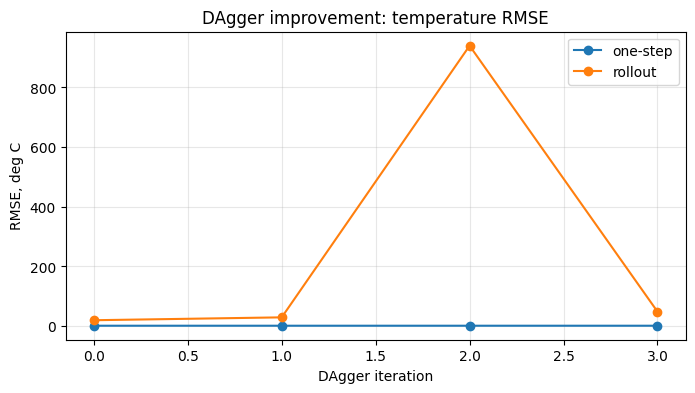

In [4]:
plot_dagger_curves(dagger_metrics, OUT / 'figures')

summary = dagger_metrics.pivot_table(
    index=['dagger_iteration', 'aggregate_rows'],
    columns=['metric_scope', 'horizon', 'state'],
    values='rmse',
)
summary

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.4248086e+03 1.95e+01 2.71e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  15  1.0559567e+02 4.65e-08 4.84e-09  -8.6 1.60e-04    -  1.00e+00 1.00e+00h  1
  16  1.0559567e+02 1.08e-08 1.13e-09  -8.6 7.72e-05    -  1.00e+00 1.00e+00h  1
  17  1.0559567e+02 2.93e-09 3.03e-10  -9.0 4.01e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 17

                                   (scaled)                 (unscaled)
Objective...............:   1.0559567249156090e+02    1.0559567249156090e+02
Dual infeasibility......:   3.0294861677208826e-10    3.0294861677208826e-10
Constraint violation....:   8.2862190045945144e-10    2.9255033950903453e-09
Variable bound violation:   9.9605677039704688e-09    9.9605677039704688e-09
Complementarity.........:   3.3143572236201801e-09    3.3143572236201801e-09
Overall NLP error.......:   3.3143572236201801e-09    3.3143572236201801e-09


Number of objective function evaluations             = 18
Number of objective gradient evaluations             = 18
Number of equality constraint evaluations            = 18
Number of inequal

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.2550688e+02 8.49e+00 2.30e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   2  3.8405581e+02 2.58e-01 9.37e-02  -1.0 1.98e+01    -  1.00e+00 1.00e+00h  1
   3  3.7711881e+02 1.30e-02 1.12e-01  -2.5 5.68e+00    -  9.73e-01 9.96e-01f  1
   4  3.7678368e+02 1.71e-03 1.29e-03  -2.5 2.39e+00    -  1.00e+00 1.00e+00f  1
   5  3.7660771e+02 4.47e-04 3.61e-04  -3.8 1.26e+00    -  1.00e+00 1.00e+00f  1
   6  3.7660512e+02 7.06e-05 5.99e-05  -3.8 4.68e-01    -  1.00e+00 1.00e+00h  1
   7  3.7659572e+02 1.76e-05 1.02e-02  -5.7 2.38e-01    -  9.51e-01 1.00e+00h  1
   8  3.7659559e+02 4.38e-06 3.33e-03  -5.7 1.33e-01    -  9.63e-01 1.00e+00h  1
   9  3.7659555e+02 1.01e-06 1.33e-06  -5.7 6.38e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.7659542e+02 2.40e-07 4.13e-04  -8.6 2.94e-02    -  9.80e-01 1.00e+00h  1
  11  3.7659542e+02 3.27e-08 4.58e-08  -8.6 8.69e-03    -  1.00e+00 1.00e+00h  1
  12  3.7659542e+02 1.46e-09 2.03e-09  -8.6 1.79e-03    -  1.00e+00 1.00e+00h  1
  13  3.7659542e+02 4.32e-12

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.1131618e+02 3.91e+00 1.51e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  17  2.9905108e+02 1.03e-10 1.48e-10  -9.0 3.12e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 17

                                   (scaled)                 (unscaled)
Objective...............:   2.9905107769165062e+02    2.9905107769165062e+02
Dual infeasibility......:   1.4796929173057413e-10    1.4796929173057413e-10
Constraint violation....:   2.2522822397449716e-11    1.0265921446261927e-10
Variable bound violation:   9.9935921760163637e-09    9.9935921760163637e-09
Complementarity.........:   2.1575344542031709e-09    2.1575344542031709e-09
Overall NLP error.......:   2.1575344542031709e-09    2.1575344542031709e-09


Number of objective function evaluations             = 18
Number of objective gradient evaluations             = 18
Number of equality constraint evaluations            = 18
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 18
Number of inequality constraint Jacobian evaluations = 0
Number 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  5.0325711e+02 7.98e+00 2.64e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.2780036e+02 2.78e+00 1.52e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   4  3.0196897e+02 3.91e-02 1.10e-02  -1.0 1.76e+00    -  1.00e+00 1.00e+00h  1
   5  2.9626959e+02 1.28e-02 3.18e-01  -2.5 2.55e+00    -  8.94e-01 9.52e-01f  1
   6  2.9575185e+02 5.92e-03 1.20e-03  -2.5 1.20e+00    -  1.00e+00 1.00e+00f  1
   7  2.9555467e+02 1.45e-03 6.76e-03  -3.8 7.77e-01    -  9.77e-01 9.82e-01f  1
   8  2.9554541e+02 1.42e-04 2.28e-05  -3.8 3.48e-01    -  1.00e+00 1.00e+00f  1
   9  2.9553515e+02 9.55e-06 1.89e-04  -5.7 1.11e-01    -  9.96e-01 9.95e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.9553505e+02 3.38e-08 1.42e-08  -5.7 9.65e-03    -  1.00e+00 1.00e+00f  1
  11  2.9553493e+02 3.19e-10 1.01e-10  -8.6 6.03e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   2.9553493214998196e+02    2.9553493214998196e+02
Dual infeasibility......:   1.0118428194790105e-10    1.0118428194790105e-10
Constraint viol

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.6117343e+02 1.91e+01 2.97e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  7.4314528e+02 1.87e+01 3.82e+01  -1.0 1.42e+02    -  7.03e-01 1.96e-02f  1
   2  7.5416343e+02 1.48e+01 1.62e+02  -1.0 1.87e+01    -  9.80e-01 2.09e-01h  1
   3  8.1333467e+02 3.49e+00 4.37e+01  -1.0 1.48e+01    -  1.00e+00 7.64e-01h  1
   4  8.3423987e+0

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  8.4832488e+02 8.37e+00 3.31e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   6  2.1928055e+02 4.59e-11 3.98e-11  -8.6 7.96e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:   2.1928054559227095e+02    2.1928054559227095e+02
Dual infeasibility......:   3.9794106233879170e-11    3.9794106233879170e-11
Constraint violation....:   1.3940990382101300e-11    4.5929482439532876e-11
Variable bound violation:   9.9039205725404145e-09    9.9039205725404145e-09
Complementarity.........:   4.3064807603450467e-09    4.3064807603450467e-09
Overall NLP error.......:   4.3064807603450467e-09    4.3064807603450467e-09


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 7
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 7
Number of inequality constraint Jacobian evaluations = 0
Number of La

   6  1.1595308e+02 2.00e-03 3.96e-03  -3.8 1.47e-01    -  1.00e+00 9.92e-01f  1
   7  1.1594747e+02 6.23e-05 5.32e-05  -3.8 3.22e-02    -  1.00e+00 1.00e+00f  1
   8  1.1593848e+02 1.95e-05 4.60e-03  -5.7 1.23e-02    -  1.00e+00 9.66e-01h  1
   9  1.1593816e+02 7.05e-07 5.29e-08  -5.7 1.92e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.1593805e+02 1.50e-09 3.98e-10  -8.6 1.16e-04    -  1.00e+00 1.00e+00h  1
  11  1.1593805e+02 5.68e-13 7.76e-14  -9.0 1.82e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   1.1593805031795760e+02    1.1593805031795760e+02
Dual infeasibility......:   7.7550781816278693e-14    7.7550781816278693e-14
Constraint violation....:   1.7180981776523100e-13    5.6843418860808015e-13
Variable bound violation:   9.9678749698739466e-09    9.9678749698739466e-09
Complementarity........

   2  5.3795560e+02 6.23e+00 8.94e+01  -1.0 3.30e+01    -  9.71e-01 3.36e-01f  1
   3  5.4740659e+02 2.14e+00 4.65e+00  -1.0 1.95e+01    -  1.00e+00 1.00e+00h  1
   4  5.4709682e+02 3.30e-02 2.05e-02  -1.0 2.11e+00    -  1.00e+00 1.00e+00h  1
   5  5.3816460e+02 1.88e-02 2.05e-01  -2.5 2.35e+00    -  8.89e-01 1.00e+00f  1
   6  5.3792889e+02 4.46e-04 7.70e-05  -2.5 5.31e-01    -  1.00e+00 1.00e+00h  1
   7  5.3766809e+02 5.40e-05 5.81e-03  -3.8 1.36e-01    -  1.00e+00 9.85e-01f  1
   8  5.3766302e+02 1.52e-06 6.22e-07  -3.8 1.02e-02    -  1.00e+00 1.00e+00f  1
   9  5.3764853e+02 1.23e-07 6.82e-08  -5.7 6.96e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.3764834e+02 1.21e-11 3.39e-11  -8.6 1.14e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objective...............:   5.3764834244443000e+02    5.3764834244443000e+02
Dual infeas

   9  5.7411976e+01 4.37e-05 6.44e-03  -5.7 1.30e-02    -  1.00e+00 9.48e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.7411910e+01 1.05e-06 1.02e-06  -5.7 1.04e-02    -  1.00e+00 1.00e+00f  1
  11  5.7411809e+01 2.33e-07 1.52e-03  -8.6 4.61e-03    -  1.00e+00 9.58e-01h  1
  12  5.7411804e+01 3.34e-08 2.76e-08  -8.6 1.74e-03    -  1.00e+00 1.00e+00f  1
  13  5.7411804e+01 6.23e-10 5.03e-10  -8.6 2.35e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   5.7411804032870158e+01    5.7411804032870158e+01
Dual infeasibility......:   5.0312871290001493e-10    5.0312871290001493e-10
Constraint violation....:   1.6186281116031861e-10    6.2289018387673423e-10
Variable bound violation:   9.9051002955263812e-09    9.9051002955263812e-09
Complementarity.........:   8.9318733188556328e-09    8.9318733188556328e-09
Overall NLP error.......:  

   1  1.6080720e+02 1.75e+00 1.43e+01  -1.0 1.65e+00    -  8.99e-01 7.69e-02h  1
   2  1.6871527e+02 5.41e-03 2.17e-02  -1.0 1.03e+00    -  1.00e+00 1.00e+00h  1
   3  1.6239399e+02 6.46e-03 1.44e-02  -2.5 1.08e+00    -  9.77e-01 1.00e+00f  1
   4  1.6218056e+02 1.82e-04 1.63e-05  -3.8 6.69e-02    -  1.00e+00 1.00e+00f  1
   5  1.6217160e+02 8.91e-07 1.60e-07  -5.7 7.03e-03    -  1.00e+00 1.00e+00h  1
   6  1.6217149e+02 9.64e-11 1.88e-11  -8.6 7.41e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:   1.6217148649264408e+02    1.6217148649264408e+02
Dual infeasibility......:   1.8823287650061065e-11    1.8823287650061065e-11
Constraint violation....:   2.9884869878690433e-11    9.6406438387930393e-11
Variable bound violation:   9.9058523606032622e-09    9.9058523606032622e-09
Complementarity.........:   3.8923381300950223e-09    3.8923381300950223e-09
Overall NLP error.......:   

   6  9.6179708e+01 5.19e-03 5.75e-04  -2.5 4.24e-01    -  1.00e+00 1.00e+00h  1
   7  9.6033941e+01 2.55e-04 2.01e-04  -3.8 2.31e-01    -  1.00e+00 1.00e+00f  1
   8  9.6025242e+01 4.77e-05 8.81e-03  -5.7 1.37e-01    -  1.00e+00 9.80e-01h  1
   9  9.6024912e+01 4.38e-06 8.32e-06  -5.7 6.89e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  9.6024870e+01 8.80e-07 1.29e-06  -5.7 2.72e-02    -  1.00e+00 1.00e+00h  1
  11  9.6024762e+01 7.45e-08 2.62e-06  -8.6 7.69e-03    -  1.00e+00 1.00e+00h  1
  12  9.6024761e+01 4.65e-10 6.56e-10  -8.6 6.12e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   9.6024761361425178e+01    9.6024761361425178e+01
Dual infeasibility......:   6.5573985389106422e-10    6.5573985389106422e-10
Constraint violation....:   1.0205734042711330e-10    4.6475179260596633e-10
Variable bound viol

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.5534288e+02 1.17e-06 1.53e-07  -5.7 2.93e-03    -  1.00e+00 1.00e+00f  1
  11  5.5534288e+02 6.13e-08 8.18e-09  -5.7 5.44e-04    -  1.00e+00 1.00e+00h  1
  12  5.5534271e+02 3.18e-09 1.77e-05  -8.6 2.14e-04    -  1.00e+00 9.96e-01h  1
  13  5.5534271e+02 1.02e-12 1.64e-13  -8.6 2.41e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   5.5534271126410965e+02    5.5534271126410965e+02
Dual infeasibility......:   1.6425408258986373e-13    1.6425408258986373e-13
Constraint violation....:   1.8010795002582168e-13    1.0231815394945443e-12
Variable bound violation:   9.9872359271557798e-09    9.9872359271557798e-09
Complementarity.........:   2.5443481224155904e-09    2.5443481224155904e-09
Overall NLP error.......:   2.5443481224155904e-09    2.5443481224155904e-09


Number of objective function 

   3  3.9900153e+02 1.72e+00 1.09e+01  -1.0 1.04e+02    -  3.30e-01 1.00e+00h  1
   4  3.9889416e+02 5.73e-03 4.65e-01  -1.0 1.25e+00    -  1.00e+00 1.00e+00h  1
   5  3.9414426e+02 8.69e-03 1.11e-03  -1.7 1.80e+00    -  1.00e+00 1.00e+00f  1
   6  3.9318949e+02 3.14e-03 1.63e-01  -2.5 5.16e-01    -  1.00e+00 8.79e-01f  1
   7  3.9306218e+02 7.95e-04 6.66e-04  -2.5 2.33e-01    -  1.00e+00 1.00e+00f  1
   8  3.9290472e+02 2.59e-04 5.37e-03  -3.8 1.06e-01    -  1.00e+00 9.87e-01f  1
   9  3.9290223e+02 1.93e-05 4.27e-06  -3.8 3.08e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9289337e+02 3.38e-06 7.90e-07  -5.7 1.19e-02    -  1.00e+00 1.00e+00f  1
  11  3.9289325e+02 1.88e-08 2.44e-09  -8.6 1.02e-03    -  1.00e+00 1.00e+00h  1
  12  3.9289325e+02 9.09e-13 1.52e-13  -8.6 7.86e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objecti

   7  1.9853505e+02 5.61e-08 1.54e-08  -5.7 2.15e-03    -  1.00e+00 1.00e+00h  1
   8  1.9853493e+02 6.40e-11 7.48e-12  -8.6 4.59e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.9853493015181928e+02    1.9853493015181928e+02
Dual infeasibility......:   7.4849495743754412e-12    7.4849495743754412e-12
Constraint violation....:   1.9612397366369216e-11    6.4005689637269825e-11
Variable bound violation:   9.9078507620475875e-09    9.9078507620475875e-09
Complementarity.........:   3.2046557339766333e-09    3.2046557339766333e-09
Overall NLP error.......:   3.2046557339766333e-09    3.2046557339766333e-09


Number of objective function evaluations             = 9
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 9
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evalua

   7  8.3642229e+01 5.33e-04 1.15e-04  -3.8 4.67e-02    -  1.00e+00 1.00e+00h  1
   8  8.3633524e+01 1.28e-04 3.98e-03  -5.7 2.07e-02    -  9.85e-01 9.62e-01h  1
   9  8.3633011e+01 4.21e-06 1.01e-06  -5.7 4.91e-03    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  8.3632894e+01 3.04e-08 1.27e-08  -8.6 4.85e-04    -  1.00e+00 1.00e+00h  1
  11  8.3632894e+01 3.30e-12 1.30e-12  -8.6 3.81e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   8.3632893749632430e+01    8.3632893749632430e+01
Dual infeasibility......:   1.2964074258547953e-12    1.2964074258547953e-12
Constraint violation....:   9.6437392199201678e-13    3.2969182939268649e-12
Variable bound violation:   9.8856622227047759e-09    9.8856622227047759e-09
Complementarity.........:   2.5241645081661916e-09    2.5241645081661916e-09
Overall NLP error.......:  

           S  :   t_proc      (avg)   t_wall      (avg)    n_eval
       nlp_f  |        0 (       0)  20.00us (  1.54us)        13
       nlp_g  |        0 (       0)  62.00us (  4.77us)        13
  nlp_grad_f  |        0 (       0)  35.00us (  2.50us)        14
  nlp_hess_l  |        0 (       0)  55.00us (  4.58us)        12
   nlp_jac_g  |        0 (       0)  99.00us (  7.07us)        14
       total  |   7.00ms (  7.00ms)   6.31ms (  6.31ms)         1
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of e

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.8474938e+02 2.26e-08 1.58e-06  -8.6 9.86e-03    -  1.00e+00 1.00e+00h  1
  11  3.8474938e+02 4.06e-11 1.87e-11  -8.6 4.27e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   3.8474937684924083e+02    3.8474937684924083e+02
Dual infeasibility......:   1.8701333241977534e-11    1.8701333241977534e-11
Constraint violation....:   1.2215101115765639e-11    4.0586201066616923e-11
Variable bound violation:   9.9017283261559896e-09    9.9017283261559896e-09
Complementarity.........:   2.9896598897867085e-09    2.9896598897867085e-09
Overall NLP error.......:   2.9896598897867085e-09    2.9896598897867085e-09


Number of objective function evaluations             = 12
Number of objective gradient evaluations             = 12
Number of equality constraint evaluations            = 12
Number of inequal

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.3855850e+02 2.58e+00 1.54e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   4  1.6041650e+02 1.41e-02 2.58e-02  -1.0 3.96e+00    -  1.00e+00 1.00e+00h  1
   5  1.5538393e+02 4.63e-02 8.34e-01  -2.5 2.97e+00    -  8.78e-01 9.84e-01f  1
   6  1.5494022e+02 1.71e-02 3.19e-03  -2.5 1.40e+00    -  1.00e+00 1.00e+00f  1
   7  1.5474621e+02 5.91e-03 6.31e-02  -3.8 7.07e-01    -  9.21e-01 9.64e-01h  1
   8  1.5472729e+02 9.06e-04 8.82e-05  -3.8 2.03e-01    -  1.00e+00 1.00e+00h  1
   9  1.5471801e+02 2.01e-04 1.32e-02  -5.7 3.83e-02    -  9.86e-01 9.12e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.5471702e+02 3.11e-05 1.04e-03  -5.7 6.06e-03    -  1.00e+00 9.55e-01h  1
  11  1.5471697e+02 3.39e-06 8.60e-07  -5.7 1.89e-03    -  1.00e+00 1.00e+00f  1
  12  1.5471686e+02 7.14e-07 7.46e-05  -8.6 8.27e-04    -  1.00e+00 9.75e-01h  1
  13  1.5471686e+02 4.57e-08 1.10e-08  -8.6 2.31e-04    -  1.00e+00 1.00e+00f  1
  14  1.5471686e+02 2.21e-10 5.13e-11  -8.6 1.70e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.4648413e+02 7.24e+00 2.77e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.9160823e+02 2.55e+00 1.52e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   9  3.3507031e+02 2.45e-05 7.28e-03  -5.7 3.99e-02    -  1.00e+00 9.52e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.3506980e+02 2.16e-07 2.17e-08  -5.7 2.56e-03    -  1.00e+00 1.00e+00f  1
  11  3.3506967e+02 3.61e-10 8.18e-08  -8.6 3.32e-04    -  1.00e+00 1.00e+00h  1
  12  3.3506967e+02 6.82e-13 7.39e-14  -8.6 3.91e-07    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   3.3506966718512132e+02    3.3506966718512132e+02
Dual infeasibility......:   7.3915002113599233e-14    7.3915002113599233e-14
Constraint violation....:   2.0631648273068693e-13    6.8212102632969618e-13
Variable bound violation:   9.9757634904344521e-09    9.9757634904344521e-09
Complementarity.........:   2.5070494874039064e-09    2.5070494874039064e-09
Overall NLP error.......:   2.5070494874039064e-09    2.5070494874039064e-09


Number of objective function 

   9  6.6510435e+02 1.14e-06 6.48e-07  -5.7 1.07e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.6510416e+02 1.03e-09 7.72e-10  -8.6 3.09e-04    -  1.00e+00 1.00e+00h  1
  11  6.6510416e+02 5.68e-13 1.74e-13  -9.0 3.82e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   6.6510416459234682e+02    6.6510416459234682e+02
Dual infeasibility......:   1.7408728001779973e-13    1.7408728001779973e-13
Constraint violation....:   1.6017518355918754e-13    5.6843418860808015e-13
Variable bound violation:   9.9949994947223786e-09    9.9949994947223786e-09
Complementarity.........:   9.0911105636743483e-10    9.0911105636743483e-10
Overall NLP error.......:   9.0911105636743483e-10    9.0911105636743483e-10


Number of objective function evaluations             = 12
Number of objective gradient evaluations            

   6  3.2766578e+02 2.96e-02 2.26e-02  -2.5 1.14e+00    -  1.00e+00 9.70e-01h  1
   7  3.2746517e+02 8.45e-03 4.12e-03  -3.8 3.20e-01    -  9.80e-01 1.00e+00h  1
   8  3.2746260e+02 6.16e-04 6.04e-05  -3.8 2.16e-02    -  1.00e+00 1.00e+00h  1
   9  3.2745276e+02 3.60e-05 1.12e-04  -5.7 9.34e-03    -  1.00e+00 9.87e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.2745263e+02 5.45e-08 1.17e-08  -5.7 2.95e-04    -  1.00e+00 1.00e+00f  1
  11  3.2745251e+02 1.60e-09 1.21e-10  -8.6 1.17e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   3.2745250840903759e+02    3.2745250840903759e+02
Dual infeasibility......:   1.2079746527790747e-10    1.2079746527790747e-10
Constraint violation....:   3.6271732166945352e-10    1.6015064829844050e-09
Variable bound violation:   9.9873582737330935e-09    9.9873582737330935e-09
Complementarity........

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.3378877e+02 2.33e+00 1.54e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.2762140e+02 2.16e+00 1.41e+01  -1.0 2.33e+00    -  8.42e-01 7.49e-02h  1
   2  2.3596588e+02 1.15e-02 3.03e-02  -1.0 2.16e+00    -  1.00e+00 1.00e+00h  1
   3  2.2959749e+02 4.24e-03 2.59e-02  -2.5 1.36e+00    -  9.76e-01 1.00e+00f  1
   4  2.2933327e+0

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.4703918e+02 5.07e+00 1.63e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.7814547e+03 1.56e+01 3.58e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.7411983e+03 1.54e+01 4.15e+01  -1.0 1.36e+02    -  6.65e-01 1.70e-02f  1
   2  1.7413397e+03 1.21e+01 1.87e+02  -1.0 2.20e+01    -  9.78e-01 2.12e-01h  1
   3  1.7999437e+03 2.67e+00 4.77e+01  -1.0 1.21e+01    -  1.00e+00 7.79e-01h  1
   4  1.8186763e+0

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.7549466e+02 9.32e+00 1.64e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  13  7.5079083e+01 1.93e-07 8.04e-04  -8.6 7.69e-04    -  1.00e+00 9.52e-01h  1
  14  7.5079076e+01 6.44e-09 2.15e-05  -8.6 2.42e-04    -  1.00e+00 9.98e-01f  1
  15  7.5079076e+01 7.51e-10 4.64e-10  -8.6 9.77e-05    -  1.00e+00 1.00e+00f  1
  16  7.5079076e+01 1.70e-10 1.06e-10  -8.6 4.65e-05    -  1.00e+00 1.00e+00h  1
  17  7.5079076e+01 3.98e-11 2.33e-11  -9.0 2.19e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 17

                                   (scaled)                 (unscaled)
Objective...............:   7.5079076074282796e+01    7.5079076074282796e+01
Dual infeasibility......:   2.3307868665728533e-11    2.3307868665728533e-11
Constraint violation....:   1.1779797431417922e-11    3.9790393202565610e-11
Variable bound violation:   9.9680008691649391e-09    9.9680008691649391e-09
Complementarity.........:   5.8689274263006538e-09    5.8689274263006538e-09
Overall NLP error.......:   5.8689274263006538e-09    5.8689274263006538e-09


Number of objective function 

   6  1.2775070e+02 5.69e-03 1.11e-03  -2.5 2.40e-01    -  1.00e+00 1.00e+00h  1
   7  1.2759536e+02 8.16e-04 3.93e-04  -3.8 6.02e-02    -  1.00e+00 1.00e+00f  1
   8  1.2758601e+02 1.42e-05 4.49e-03  -5.7 1.16e-02    -  9.25e-01 1.00e+00h  1
   9  1.2758584e+02 4.25e-06 1.04e-06  -5.7 1.60e-03    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.2758572e+02 3.03e-08 1.37e-06  -8.6 2.12e-04    -  9.99e-01 1.00e+00h  1
  11  1.2758572e+02 1.93e-12 4.96e-13  -8.6 1.21e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   1.2758571797321513e+02    1.2758571797321513e+02
Dual infeasibility......:   4.9595963729116843e-13    4.9595963729116843e-13
Constraint violation....:   5.0083452017152864e-13    1.9326762412674725e-12
Variable bound violation:   9.9260317742988491e-09    9.9260317742988491e-09
Complementarity........

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.8523173e+02 8.72e+00 3.48e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  9.5384690e+02 8.52e+00 3.51e+01  -1.0 8.08e+01    -  7.41e-01 2.29e-02f  1
   2  9.4924861e+02 7.40e+00 1.91e+02  -1.0 5.71e+01    -  9.69e-01 1.32e-01h  1
   3  1.0100607e+03 2.69e+00 1.51e+02  -1.0 2.88e+01    -  1.00e+00 6.36e-01h  1
   4  1.0564982e+0

  12  6.4352128e+02 1.42e-06 3.53e-07  -5.7 1.60e-03    -  1.00e+00 1.00e+00f  1
  13  6.4352113e+02 1.11e-08 2.30e-09  -8.6 1.16e-04    -  1.00e+00 1.00e+00h  1
  14  6.4352113e+02 5.68e-13 2.27e-13  -9.0 5.04e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   6.4352112939614892e+02    6.4352112939614892e+02
Dual infeasibility......:   2.2737367544323206e-13    2.2737367544323206e-13
Constraint violation....:   9.9745423391646242e-14    5.6843418860808015e-13
Variable bound violation:   9.9988695656527682e-09    9.9988695656527682e-09
Complementarity.........:   9.0936470892505940e-10    9.0936470892505940e-10
Overall NLP error.......:   9.0936470892505940e-10    9.0936470892505940e-10


Number of objective function evaluations             = 15
Number of objective gradient evaluations             = 15
Number of equality constraint evaluations            = 15
Number of inequal

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.2408277e+02 2.52e-05 1.18e-03  -5.7 2.34e-02    -  1.00e+00 9.84e-01h  1
  11  2.2408248e+02 1.34e-07 5.32e-08  -5.7 1.40e-03    -  1.00e+00 1.00e+00f  1
  12  2.2408234e+02 5.31e-10 1.43e-10  -8.6 1.32e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   2.2408233693821879e+02    2.2408233693821879e+02
Dual infeasibility......:   1.4308374153659511e-10    1.4308374153659511e-10
Constraint violation....:   1.6032039779652740e-10    5.3057647164678201e-10
Variable bound violation:   9.9186565627462642e-09    9.9186565627462642e-09
Complementarity.........:   5.1087986097598221e-09    5.1087986097598221e-09
Overall NLP error.......:   5.1087986097598221e-09    5.1087986097598221e-09


Number of objective function evaluations             = 13
Number of objective gradient evaluations            

   3  6.0421954e+01 8.79e-03 8.58e-02  -2.5 1.23e+00    -  9.71e-01 9.28e-01f  1
   4  5.9928371e+01 1.58e-03 6.18e-04  -2.5 4.66e-01    -  1.00e+00 1.00e+00f  1
   5  5.9750717e+01 4.18e-04 1.78e-02  -3.8 1.53e-01    -  9.50e-01 1.00e+00f  1
   6  5.9746521e+01 4.31e-05 6.95e-06  -3.8 2.75e-02    -  1.00e+00 1.00e+00h  1
   7  5.9738424e+01 1.35e-05 1.19e-02  -5.7 1.16e-02    -  9.84e-01 8.95e-01h  1
   8  5.9737491e+01 2.15e-06 2.38e-07  -5.7 3.67e-03    -  1.00e+00 1.00e+00f  1
   9  5.9737488e+01 1.24e-07 1.14e-08  -5.7 9.47e-04    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.9737381e+01 8.88e-09 1.82e-05  -8.6 2.51e-04    -  1.00e+00 9.97e-01h  1
  11  5.9737381e+01 1.01e-11 9.39e-13  -8.6 8.68e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   5.9737380742708275e+01    5.9737380742708275e+01
Dual infeas

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.4679479e+02 1.12e+01 1.66e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.4336206e+02 1.07e+01 3.07e+01  -1.0 4.80e+01    -  8.37e-01 4.47e-02f  1
   2  1.5473312e+02 5.87e+00 3.47e+01  -1.0 2.52e+01    -  7.52e-01 4.39e-01h  1
   3  1.7574611e+02 4.80e-01 1.76e+00  -1.0 1.52e+01    -  1.00e+00 1.00e+00h  1
   4  1.7594743e+0

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1578154e+03 5.78e+00 3.01e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.7924322e+02 8.03e-06 3.36e-07  -5.7 1.06e-02    -  1.00e+00 1.00e+00h  1
  11  1.7924311e+02 2.37e-07 3.65e-07  -8.6 1.92e-03    -  1.00e+00 1.00e+00h  1
  12  1.7924311e+02 2.19e-10 8.39e-12  -8.6 5.46e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   1.7924310966580191e+02    1.7924310966580191e+02
Dual infeasibility......:   8.3871068208648619e-12    8.3871068208648619e-12
Constraint violation....:   4.2132041711673309e-11    2.1873347577638922e-10
Variable bound violation:   9.9845864909298143e-09    9.9845864909298143e-09
Complementarity.........:   2.9715926985969397e-09    2.9715926985969397e-09
Overall NLP error.......:   2.9715926985969397e-09    2.9715926985969397e-09


Number of objective function evaluations             = 13
Number of objective gradient evaluations            

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.3656172e+02 6.94e+00 1.54e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   1  1.1553354e+02 4.30e+00 1.52e+01  -1.0 5.67e+00    -  6.46e-01 7.42e-02f  1
   2  1.1774087e+02 3.52e-01 7.78e+00  -1.0 6.18e+00    -  5.44e-01 9.22e-01f  1
   3  1.1738877e+02 6.33e-02 8.73e-02  -1.0 2.25e+00    -  1.00e+00 1.00e+00f  1
   4  1.1283584e+02 2.54e-02 3.96e-02  -1.7 2.49e+00    -  1.00e+00 1.00e+00f  1
   5  1.1170169e+02 1.87e-02 1.02e-02  -2.5 1.66e+00    -  1.00e+00 1.00e+00f  1
   6  1.1165705e+02 2.20e-03 1.58e-03  -2.5 6.41e-01    -  1.00e+00 1.00e+00h  1
   7  1.1149922e+02 7.63e-04 6.73e-04  -3.8 3.80e-01    -  1.00e+00 1.00e+00f  1
   8  1.1149685e+02 5.44e-05 1.24e-04  -3.8 1.09e-01    -  1.00e+00 1.00e+00h  1
   9  1.1148821e+02 1.09e-05 2.45e-05  -5.7 4.14e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.1148814e+02 4.98e-07 8.42e-07  -5.7 1.45e-02    -  1.00e+00 1.00e+00h  1
  11  1.1148803e+02 1.55e-08 9.48e-06  -8.6 1.07e-03    -  9.99e-01 1.00e+00h  1
  12  1.1148803e+02 5.88e-11

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.5997155e+03 1.90e+01 3.58e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1123109e+03 1.59e+01 3.97e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.3140974e+01 1.52e+02 1.60e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  5.4698162e+01 1.71e+00 1.66e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  5.1797176e+01 1.54e+00 1.46e+01  -1.0 7.57e+00    -  9.79e-01 1.00e-01f  1
   2  5.3753455e+01 1.20e-01 1.28e+00  -1.0 3.94e+00    -  1.00e+00 1.00e+00f  1
   3  5.2998890e+01 6.30e-02 2.35e-02  -1.0 1.64e+00    -  1.00e+00 1.00e+00f  1
   4  4.8264400e+0

   1  1.3766171e+02 5.83e+00 3.85e+01  -1.0 1.57e+01    -  9.00e-01 4.98e-02f  1
   2  1.4762213e+02 4.00e+00 1.13e+02  -1.0 2.71e+01    -  9.09e-01 3.07e-01h  1
   3  1.7475234e+02 5.88e-01 1.45e+01  -1.0 1.39e+01    -  8.21e-01 8.54e-01h  1
   4  1.8071299e+02 1.67e-02 1.53e-01  -1.0 3.56e+00    -  1.00e+00 1.00e+00h  1
   5  1.7474240e+02 1.93e-02 1.15e-01  -2.5 1.54e+00    -  9.17e-01 9.27e-01f  1
   6  1.7400478e+02 7.79e-03 2.47e-02  -2.5 5.38e-01    -  1.00e+00 1.00e+00f  1
   7  1.7379483e+02 2.27e-03 6.62e-02  -3.8 1.12e-01    -  9.25e-01 1.00e+00f  1
   8  1.7379180e+02 1.42e-04 2.71e-05  -3.8 1.76e-02    -  1.00e+00 1.00e+00h  1
   9  1.7378113e+02 1.51e-05 5.22e-04  -5.7 5.91e-03    -  9.90e-01 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.7378110e+02 1.33e-07 2.72e-08  -5.7 6.18e-04    -  1.00e+00 1.00e+00h  1
  11  1.7378097e+02 3.53e-10 1.16e-10  -8.6 5.06e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.3238377e+03 1.34e+01 4.40e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   2  1.4818932e+03 1.56e+01 5.51e+01  -1.0 8.18e+01    -  6.01e-03 2.02e-02f  1
   3  1.4702195e+03 1.55e+01 1.10e+02  -1.0 1.09e+02    -  1.38e-01 9.97e-03f  1
   4  1.4496632e+03 1.47e+01 7.75e+02  -1.0 8.61e+01    -  7.02e-01 4.76e-02f  1
   5  1.4248035e+03 1.15e+01 7.34e+02  -1.0 2.05e+01    -  6.85e-01 2.21e-01f  1
   6  1.3966333e+03 4.14e+00 2.93e+02  -1.0 1.60e+01    -  9.21e-01 6.40e-01f  1
   7  1.3860898e+03 6.60e-02 1.31e+00  -1.0 7.77e+00    -  1.00e+00 1.00e+00f  1
   8  1.3860755e+03 1.95e-04 7.57e-03  -1.0 2.42e+00    -  1.00e+00 1.00e+00h  1
   9  1.3787729e+03 2.00e-01 2.47e+00  -2.5 2.54e+00    -  8.23e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.3782806e+03 1.27e-01 9.96e-01  -2.5 1.33e+00    -  8.56e-01 1.00e+00f  1
  11  1.3782552e+03 2.63e-03 5.53e-04  -2.5 6.34e-01    -  1.00e+00 1.00e+00h  1
  12  1.3780380e+03 6.85e-04 4.93e-02  -3.8 6.35e-01    -  9.76e-01 1.00e+00f  1
  13  1.3780354e+03 8.54e-05

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.9823833e+01 5.47e+00 1.76e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   8  1.1252850e+02 1.72e-03 9.89e-02  -3.8 4.71e-02    -  1.00e+00 7.08e-01f  1
   9  1.1248917e+02 4.23e-04 3.43e-05  -3.8 1.51e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.1248178e+02 9.56e-05 3.58e-03  -5.7 6.77e-03    -  1.00e+00 8.70e-01h  1
  11  1.1248078e+02 1.62e-05 1.67e-03  -5.7 6.08e-03    -  1.00e+00 8.82e-01h  1
  12  1.1248065e+02 1.55e-06 5.05e-07  -5.7 3.17e-03    -  1.00e+00 1.00e+00f  1
  13  1.1248055e+02 2.99e-07 1.42e-04  -8.6 1.05e-03    -  1.00e+00 9.53e-01h  1
  14  1.1248055e+02 3.39e-08 1.32e-08  -8.6 4.52e-04    -  1.00e+00 1.00e+00f  1
  15  1.1248055e+02 9.66e-10 4.28e-10  -8.6 8.39e-05    -  1.00e+00 1.00e+00h  1
  16  1.1248054e+02 2.61e-12 1.01e-12  -9.0 4.07e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   1.1248054494367265e+02    1.1248054494367265e+02
Dual infeas

   5  4.5774663e+02 1.57e-04 2.62e-04  -1.0 6.15e-01    -  1.00e+00 1.00e+00h  1
   6  4.5071351e+02 1.28e-02 4.57e-01  -2.5 1.76e+00    -  9.33e-01 9.88e-01f  1
   7  4.5037823e+02 3.72e-03 2.44e-03  -2.5 9.79e-01    -  1.00e+00 1.00e+00f  1
   8  4.5014935e+02 1.17e-03 1.44e-02  -3.8 5.74e-01    -  9.74e-01 1.00e+00f  1
   9  4.5014625e+02 1.79e-04 1.44e-04  -3.8 2.14e-01    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.5013500e+02 2.78e-05 5.13e-03  -5.7 5.84e-02    -  1.00e+00 9.63e-01h  1
  11  4.5013455e+02 2.95e-06 8.82e-07  -5.7 1.07e-02    -  1.00e+00 1.00e+00f  1
  12  4.5013454e+02 1.57e-07 4.92e-08  -5.7 1.85e-03    -  1.00e+00 1.00e+00h  1
  13  4.5013440e+02 6.19e-09 1.64e-09  -8.6 3.03e-04    -  1.00e+00 1.00e+00h  1
  14  4.5013440e+02 5.68e-13 2.28e-13  -8.6 1.71e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objecti

  15  4.2995697e+03 4.70e-11 2.35e-09  -8.6 9.71e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   4.2995697256131589e+03    4.2995697256131589e+03
Dual infeasibility......:   2.3469510779250413e-09    2.3469510779250413e-09
Constraint violation....:   7.7655634494821016e-12    4.6952663979027414e-11
Variable bound violation:   9.9973578304712873e-09    9.9973578304712873e-09
Complementarity.........:   6.7255210537318275e-09    6.7255210537318275e-09
Overall NLP error.......:   5.8072732862901801e-09    6.7255210537318275e-09


Number of objective function evaluations             = 16
Number of objective gradient evaluations             = 16
Number of equality constraint evaluations            = 16
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 16
Number of inequality constraint Jacobian evaluations = 0
Number 

   9  1.8225745e+03 7.16e-01 3.08e+01  -1.0 1.18e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.8281364e+03 2.27e-03 3.12e-02  -1.0 4.68e+00    -  1.00e+00 1.00e+00h  1
  11  1.8208188e+03 4.42e-02 1.59e+00  -2.5 2.66e+00    -  8.70e-01 9.95e-01f  1
  12  1.8205693e+03 1.37e-02 1.09e-03  -2.5 9.66e-01    -  1.00e+00 1.00e+00f  1
  13  1.8203317e+03 3.61e-03 2.79e-01  -3.8 3.41e-01    -  8.98e-01 1.00e+00f  1
  14  1.8203257e+03 5.06e-04 7.70e-05  -3.8 9.40e-02    -  1.00e+00 1.00e+00h  1
  15  1.8203130e+03 3.59e-05 3.83e-03  -5.7 4.21e-02    -  9.92e-01 1.00e+00h  1
  16  1.8203128e+03 1.21e-06 5.79e-07  -5.7 8.10e-03    -  1.00e+00 1.00e+00h  1
  17  1.8203126e+03 7.93e-09 2.94e-09  -8.6 6.31e-04    -  1.00e+00 1.00e+00h  1
  18  1.8203126e+03 6.82e-13 4.73e-13  -8.6 2.78e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 18

                                   (scaled)                 (unscaled)
Objecti

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.2336111e+01 2.53e+01 1.66e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  8.5145140e+01 2.16e+00 1.66e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.4248086e+03 1.47e+01 2.72e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  12  5.7942489e+01 3.49e-07 7.06e-07  -5.7 4.71e-03    -  1.00e+00 1.00e+00f  1
  13  5.7942373e+01 1.05e-07 2.09e-04  -8.6 2.62e-03    -  1.00e+00 9.89e-01h  1
  14  5.7942370e+01 4.27e-09 3.60e-08  -8.6 1.10e-03    -  1.00e+00 1.00e+00f  1
  15  5.7942370e+01 1.16e-10 2.25e-09  -8.6 2.79e-04    -  1.00e+00 1.00e+00h  1
  16  5.7942370e+01 1.82e-12 1.57e-11  -9.0 2.36e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   5.7942369943040845e+01    5.7942369943040845e+01
Dual infeasibility......:   1.5703882638717914e-11    1.5703882638717914e-11
Constraint violation....:   5.0600386816137161e-13    1.8189894035458565e-12
Variable bound violation:   9.9596981772975823e-09    9.9596981772975823e-09
Complementarity.........:   1.0449907890843350e-09    1.0449907890843350e-09
Overall NLP error.......:   1.0449907890843350e-09    1.0449907890843350e-09


Number of objective function 

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.1237891e+01 1.59e+01 1.33e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  8.7584244e+01 1.47e+01 1.79e+01  -1.0 1.59e+01    -  8.42e-01 7.71e-02h  1
   2  9.5386802e+01 1.14e-01 1.31e+00  -1.0 1.47e+01    -  1.00e+00 1.00e+00h  1
   3  9.4652412e+01 1.79e-02 4.48e+00  -1.0 3.06e+00    -  3.53e-01 1.00e+00f  1
   4  9.4034451e+0

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.3673534e+02 3.95e+02 1.54e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.7488872e+02 2.19e+00 1.25e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.8989910e+02 1.02e+00 1.25e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.8091232e+02 9.71e-01 2.34e+01  -1.0 2.88e+01    -  5.51e-01 4.56e-02f  1
   2  2.8800545e+02 4.57e-01 3.88e+01  -1.0 9.52e+00    -  9.79e-01 5.29e-01h  1
   3  2.9490484e+02 9.64e-03 2.57e-01  -1.0 3.78e+00    -  1.00e+00 1.00e+00h  1
   4  2.8918057e+0

  13  6.0428073e+01 1.14e-12 8.59e-13  -9.0 2.83e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   6.0428072882721239e+01    6.0428072882721239e+01
Dual infeasibility......:   8.5897569104696943e-13    8.5897569104696943e-13
Constraint violation....:   3.0277061751362730e-13    1.1368683772161603e-12
Variable bound violation:   9.9822250793833738e-09    9.9822250793833738e-09
Complementarity.........:   9.1337243137084134e-10    9.1337243137084134e-10
Overall NLP error.......:   9.1337243137084134e-10    9.1337243137084134e-10


Number of objective function evaluations             = 14
Number of objective gradient evaluations             = 14
Number of equality constraint evaluations            = 14
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 14
Number of inequality constraint Jacobian evaluations = 0
Number 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.5952973e+02 3.89e+02 1.91e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   9  1.4122069e+02 4.42e-03 2.57e-03  -2.5 8.40e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.4100050e+02 2.74e-04 1.78e-04  -3.8 3.26e-01    -  1.00e+00 1.00e+00f  1
  11  1.4099834e+02 8.72e-06 1.32e-05  -3.8 4.84e-02    -  1.00e+00 1.00e+00h  1
  12  1.4098681e+02 1.06e-06 2.62e-03  -5.7 3.25e-02    -  1.00e+00 9.84e-01f  1
  13  1.4098654e+02 3.28e-07 1.16e-06  -5.7 1.28e-02    -  1.00e+00 1.00e+00f  1
  14  1.4098652e+02 2.84e-08 1.00e-07  -5.7 3.75e-03    -  1.00e+00 1.00e+00h  1
  15  1.4098638e+02 9.07e-10 3.43e-09  -8.6 7.69e-04    -  1.00e+00 1.00e+00h  1
  16  1.4098638e+02 5.68e-13 1.83e-12  -8.6 1.61e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   1.4098637881603366e+02    1.4098637881603366e+02
Dual infeasibility......:   1.8331830462744648e-12    1.8331830462744648e-12
Constraint viol

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.3283416e+02 4.49e-06 1.73e-06  -5.7 3.49e-02    -  1.00e+00 1.00e+00f  1
  11  2.3283415e+02 9.27e-07 3.51e-07  -5.7 1.54e-02    -  1.00e+00 1.00e+00h  1
  12  2.3283402e+02 3.15e-07 1.98e-04  -8.6 8.88e-03    -  1.00e+00 9.92e-01h  1
  13  2.3283402e+02 6.32e-08 2.39e-08  -8.6 4.02e-03    -  1.00e+00 1.00e+00f  1
  14  2.3283402e+02 7.08e-09 2.68e-09  -8.6 1.35e-03    -  1.00e+00 1.00e+00h  1
  15  2.3283402e+02 1.55e-10 5.86e-11  -8.6 1.99e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   2.3283401643475344e+02    2.3283401643475344e+02
Dual infeasibility......:   5.8568777086007393e-11    5.8568777086007393e-11
Constraint violation....:   4.6320434767154203e-11    1.5484147297684103e-10
Variable bound violation:   9.9647499568908255e-09    9.9647499568908255e-09
Complementarity........

   4  2.3264839e+02 8.34e-03 5.86e-02  -1.7 3.13e+00    -  1.00e+00 1.00e+00f  1
   5  2.3156371e+02 3.56e-03 1.07e+00  -2.5 2.40e+00    -  8.20e-01 1.00e+00f  1
   6  2.3144647e+02 7.41e-04 1.18e-03  -2.5 8.52e-01    -  1.00e+00 1.00e+00h  1
   7  2.3125377e+02 2.32e-04 1.35e-01  -3.8 4.38e-01    -  8.77e-01 1.00e+00f  1
   8  2.3124885e+02 9.81e-06 4.70e-05  -3.8 1.29e-01    -  1.00e+00 1.00e+00h  1
   9  2.3123793e+02 1.61e-06 2.16e-04  -5.7 4.41e-02    -  9.98e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.3123788e+02 2.58e-09 5.16e-08  -5.7 3.57e-03    -  1.00e+00 1.00e+00h  1
  11  2.3123775e+02 1.48e-10 7.53e-10  -8.6 3.91e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   2.3123774761123556e+02    2.3123774761123556e+02
Dual infeasibility......:   7.5279923355455744e-10    7.5279923355455744e-10
Constraint viol

   3  7.9205601e+01 1.05e-01 7.66e-01  -1.0 6.78e+00    -  1.00e+00 1.00e+00h  1
   4  7.3359881e+01 1.38e-02 3.17e-02  -1.7 1.73e+00    -  1.00e+00 1.00e+00f  1
   5  7.1888928e+01 1.10e-02 1.43e-01  -2.5 1.39e+00    -  1.00e+00 1.00e+00f  1
   6  7.1843515e+01 1.68e-03 1.31e-03  -2.5 5.18e-01    -  1.00e+00 1.00e+00h  1
   7  7.1644282e+01 7.37e-04 5.37e-04  -3.8 3.08e-01    -  1.00e+00 1.00e+00f  1
   8  7.1632221e+01 3.93e-05 1.65e-03  -5.7 7.39e-02    -  9.89e-01 9.95e-01h  1
   9  7.1632093e+01 9.79e-07 1.97e-06  -5.7 1.68e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  7.1632089e+01 1.19e-07 2.32e-07  -5.7 6.51e-03    -  1.00e+00 1.00e+00h  1
  11  7.1631954e+01 5.71e-09 1.24e-08  -8.6 1.30e-03    -  1.00e+00 1.00e+00h  1
  12  7.1631954e+01 8.19e-12 1.64e-11  -8.6 5.47e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objecti

  14  8.6119664e+02 1.48e-08 8.56e-08  -8.6 7.31e-03    -  1.00e+00 1.00e+00h  1
  15  8.6119664e+02 7.39e-11 2.84e-10  -8.6 5.16e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   8.6119664270755857e+02    8.6119664270755857e+02
Dual infeasibility......:   2.8433078114176169e-10    2.8433078114176169e-10
Constraint violation....:   1.1757745145829034e-11    7.3896444519050419e-11
Variable bound violation:   9.9919648666180194e-09    9.9919648666180194e-09
Complementarity.........:   4.5108478413106556e-09    4.5108478413106556e-09
Overall NLP error.......:   4.5108478413106556e-09    4.5108478413106556e-09


Number of objective function evaluations             = 16
Number of objective gradient evaluations             = 16
Number of equality constraint evaluations            = 16
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian ev

   8  1.7216603e+02 2.91e-02 1.95e-01  -2.5 2.94e+00    -  8.70e-01 8.54e-01f  1
   9  1.7101274e+02 1.67e-02 4.65e-03  -2.5 1.51e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.7080443e+02 1.72e-03 1.31e-02  -3.8 7.24e-01    -  9.96e-01 9.87e-01h  1
  11  1.7079687e+02 1.46e-04 3.58e-05  -3.8 2.26e-01    -  1.00e+00 1.00e+00h  1
  12  1.7078659e+02 2.58e-05 1.84e-03  -5.7 5.71e-02    -  1.00e+00 9.73e-01h  1
  13  1.7078623e+02 1.00e-06 2.65e-07  -5.7 6.38e-03    -  1.00e+00 1.00e+00f  1
  14  1.7078610e+02 7.20e-09 1.82e-09  -8.6 5.87e-04    -  1.00e+00 1.00e+00h  1
  15  1.7078610e+02 5.68e-13 5.86e-14  -8.6 1.85e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   1.7078609860086391e+02    1.7078609860086391e+02
Dual infeasibility......:   5.8619775700208265e-14    5.8619775700208265e-14
Constraint viol

   8  8.9074221e+01 1.76e-05 9.39e-06  -3.8 1.63e-01    -  1.00e+00 1.00e+00h  1
   9  8.9062996e+01 5.51e-06 1.64e-04  -5.7 1.04e-01    -  9.99e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  8.9062867e+01 8.40e-07 4.79e-07  -5.7 4.24e-02    -  1.00e+00 1.00e+00h  1
  11  8.9062846e+01 1.85e-07 7.54e-08  -5.7 1.96e-02    -  1.00e+00 1.00e+00h  1
  12  8.9062705e+01 5.23e-08 2.15e-08  -8.6 1.10e-02    -  1.00e+00 1.00e+00h  1
  13  8.9062704e+01 7.29e-09 2.99e-09  -8.6 3.90e-03    -  1.00e+00 1.00e+00h  1
  14  8.9062704e+01 2.30e-10 9.44e-11  -8.6 6.92e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   8.9062703571703651e+01    8.9062703571703651e+01
Dual infeasibility......:   9.4431929850630794e-11    9.4431929850630794e-11
Constraint violation....:   7.0450625164176590e-11    2.2964741219766435e-10
Variable bound viol

   3  4.0323586e+01 4.46e-03 1.87e-01  -1.7 1.58e+00    -  1.00e+00 9.52e-01f  1
   4  3.9187703e+01 2.75e-03 5.14e-01  -2.5 1.62e+00    -  1.00e+00 8.53e-01f  1
   5  3.8894324e+01 7.08e-04 2.67e-02  -2.5 1.14e+00    -  1.00e+00 1.00e+00f  1
   6  3.8669623e+01 2.20e-03 4.98e-02  -3.8 6.61e-01    -  9.42e-01 9.96e-01f  1
   7  3.8649816e+01 7.03e-04 6.33e-04  -3.8 2.88e-01    -  1.00e+00 1.00e+00f  1
   8  3.8636751e+01 6.08e-05 3.06e-03  -5.7 1.74e-01    -  9.55e-01 9.78e-01h  1
   9  3.8636121e+01 4.02e-06 1.36e-06  -5.7 5.03e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.8636086e+01 3.46e-07 9.67e-08  -5.7 4.91e-03    -  1.00e+00 1.00e+00h  1
  11  3.8635939e+01 8.54e-08 1.07e-03  -8.6 1.75e-03    -  1.00e+00 9.44e-01h  1
  12  3.8635930e+01 6.95e-09 2.69e-04  -8.6 1.32e-04    -  1.00e+00 9.73e-01f  1
  13  3.8635930e+01 6.99e-11 6.31e-11  -8.6 3.41e-05    -  1.00e+00 1.00e+00f  1
  14  3.8635930e+01 4.55e-13

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.6573980e+01 3.76e+00 1.41e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  16  1.6671329e+02 8.57e-10 7.71e-09  -8.6 3.50e-03    -  1.00e+00 1.00e+00h  1
  17  1.6671329e+02 6.43e-11 5.82e-10  -8.6 9.61e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 17

                                   (scaled)                 (unscaled)
Objective...............:   1.6671329452660706e+02    1.6671329452660706e+02
Dual infeasibility......:   5.8199134400638286e-10    5.8199134400638286e-10
Constraint violation....:   1.2430748887330413e-11    6.4346750150434673e-11
Variable bound violation:   9.9771738093501483e-09    9.9771738093501483e-09
Complementarity.........:   7.4197061466849226e-09    7.4197061466849226e-09
Overall NLP error.......:   7.4197061466849226e-09    7.4197061466849226e-09


Number of objective function evaluations             = 18
Number of objective gradient evaluations             = 18
Number of equality constraint evaluations            = 18
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian ev

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.2409526e+02 1.54e-07 3.06e-04  -8.6 3.90e-02    -  9.88e-01 1.00e+00h  1
  11  1.2409525e+02 1.55e-08 1.41e-08  -8.6 1.40e-02    -  1.00e+00 1.00e+00h  1
  12  1.2409525e+02 4.94e-10 5.38e-10  -8.6 2.69e-03    -  1.00e+00 1.00e+00h  1
  13  1.2409525e+02 7.96e-13 8.96e-13  -9.0 1.15e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   1.2409525262538135e+02    1.2409525262538135e+02
Dual infeasibility......:   8.9614505478040676e-13    8.9614505478040676e-13
Constraint violation....:   2.4651277092205629e-13    7.9580786405131221e-13
Variable bound violation:   9.9528443264773614e-09    9.9528443264773614e-09
Complementarity.........:   9.4371759326052133e-10    9.4371759326052133e-10
Overall NLP error.......:   9.4371759326052133e-10    9.4371759326052133e-10


Number of objective function 

   3  3.5348973e+01 3.09e-03 3.51e-01  -2.5 2.85e+00    -  9.62e-01 8.89e-01f  1
   4  3.4214595e+01 3.36e-04 1.36e-03  -2.5 1.45e+00    -  1.00e+00 1.00e+00f  1
   5  3.3924762e+01 4.77e-05 6.76e-05  -3.8 8.47e-01    -  1.00e+00 1.00e+00f  1
   6  3.3907804e+01 5.61e-06 4.23e-06  -5.7 2.36e-01    -  1.00e+00 1.00e+00f  1
   7  3.3907664e+01 1.85e-08 1.30e-08  -5.7 1.47e-02    -  1.00e+00 1.00e+00h  1
   8  3.3907487e+01 1.44e-11 1.10e-11  -8.6 4.25e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   3.3907487097576066e+01    3.3907487097576066e+01
Dual infeasibility......:   1.1042551797951902e-11    1.1042551797951902e-11
Constraint violation....:   4.4098410547629014e-12    1.4438228390645236e-11
Variable bound violation:   9.9117512373932321e-09    9.9117512373932321e-09
Complementarity.........:   2.7729657961826712e-09    2.7729657961826712e-09
Overall NLP error.......:   

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.6934977e+01 3.26e+00 1.40e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  12  1.4414026e+02 2.98e-07 7.63e-07  -5.7 2.99e-02    -  1.00e+00 1.00e+00h  1
  13  1.4414009e+02 9.60e-09 2.72e-08  -8.6 5.37e-03    -  1.00e+00 1.00e+00h  1
  14  1.4414009e+02 6.71e-12 1.77e-11  -8.6 1.44e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   1.4414009417945445e+02    1.4414009417945445e+02
Dual infeasibility......:   1.7656986983638490e-11    1.7656986983638490e-11
Constraint violation....:   1.1018323524011243e-12    6.7075234255753458e-12
Variable bound violation:   9.9668990838353011e-09    9.9668990838353011e-09
Complementarity.........:   2.6960758725447948e-09    2.6960758725447948e-09
Overall NLP error.......:   2.6960758725447948e-09    2.6960758725447948e-09


Number of objective function evaluations             = 15
Number of objective gradient evaluations             = 15
Number of equality constraint evaluations            = 15
Number of inequal

  11  6.8375236e+01 2.97e-06 4.03e-06  -5.7 4.48e-02    -  1.00e+00 1.00e+00f  1
  12  6.8375111e+01 3.36e-08 4.39e-08  -8.6 4.61e-03    -  1.00e+00 1.00e+00h  1
  13  6.8375111e+01 3.98e-12 4.67e-12  -8.6 4.27e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   6.8375111114813677e+01    6.8375111114813677e+01
Dual infeasibility......:   4.6680508562741514e-12    4.6680508562741514e-12
Constraint violation....:   7.2617309210124597e-13    3.9790393202565610e-12
Variable bound violation:   9.9737186842752124e-09    9.9737186842752124e-09
Complementarity.........:   2.5178432834658009e-09    2.5178432834658009e-09
Overall NLP error.......:   2.5178432834658009e-09    2.5178432834658009e-09


Number of objective function evaluations             = 14
Number of objective gradient evaluations             = 14
Number of equality constraint evaluations            = 14
Number of inequal

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.7428166e+02 1.17e-06 6.52e-06  -5.7 5.66e-02    -  1.00e+00 1.00e+00f  1
  11  1.7428153e+02 5.78e-08 1.42e-04  -8.6 1.70e-02    -  9.94e-01 9.99e-01h  1
  12  1.7428153e+02 3.28e-10 5.94e-09  -8.6 1.71e-03    -  1.00e+00 1.00e+00f  1
  13  1.7428153e+02 3.41e-13 8.75e-13  -9.0 2.07e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   1.7428152714108617e+02    1.7428152714108617e+02
Dual infeasibility......:   8.7459244951608562e-13    8.7459244951608562e-13
Constraint violation....:   1.1007433269587542e-13    3.4106051316484809e-13
Variable bound violation:   9.9874268686706972e-09    9.9874268686706972e-09
Complementarity.........:   9.1127597937665092e-10    9.1127597937665092e-10
Overall NLP error.......:   9.1127597937665092e-10    9.1127597937665092e-10


Number of objective function 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  8.7286470e+01 2.10e+00 1.34e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   7  4.9573584e+01 1.20e-03 2.99e-04  -2.5 1.08e-01    -  1.00e+00 1.00e+00h  1
   8  4.9411332e+01 5.85e-03 8.51e-03  -3.8 3.04e-01    -  1.00e+00 9.74e-01f  1
   9  4.9405076e+01 2.76e-04 4.23e-05  -3.8 2.84e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.9396875e+01 7.55e-05 7.53e-03  -5.7 1.88e-02    -  1.00e+00 8.96e-01h  1
  11  4.9395904e+01 2.01e-06 6.44e-07  -5.7 2.49e-03    -  1.00e+00 1.00e+00f  1
  12  4.9395788e+01 1.88e-08 2.08e-06  -8.6 2.36e-04    -  1.00e+00 9.98e-01h  1
  13  4.9395788e+01 6.82e-13 2.86e-13  -8.6 3.19e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   4.9395787579420990e+01    4.9395787579420990e+01
Dual infeasibility......:   2.8555021592147211e-13    2.8555021592147211e-13
Constraint violation....:   2.0707807106775625e-13    6.8212102632969618e-13
Variable bound viol

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.8162059e+01 2.72e+02 1.24e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.5198120e+02 1.46e+01 1.36e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.6321248e+02 2.64e+00 1.22e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.5280601e+02 2.49e+00 2.08e+01  -1.0 3.48e+01    -  5.96e-01 5.92e-02f  1
   2  2.6063752e+02 1.39e+00 2.69e+01  -1.0 9.18e+00    -  8.35e-01 4.41e-01h  1
   3  2.7087708e+02 2.52e-02 5.32e-01  -1.0 4.21e+00    -  1.00e+00 1.00e+00h  1
   4  2.6620764e+02 7.71e-03 1.14e+00  -1.7 5.32e+00    -  1.00e+00 8.95e-01f  1
   5  2.6567763e+02 1.21e-03 1.42e-02  -1.7 2.10e+00    -  1.00e+00 1.00e+00f  1
   6  2.6458394e+02 1.52e-03 3.67e-01  -3.8 2.57e+00    -  8.03e-01 8.63e-01f  1
   7  2.6434882e+02 1.02e-03 8.49e-01  -3.8 1.10e+00    -  7.11e-01 1.00e+00f  1
   8  2.6433016e+02 1.69e-04 2.35e-01  -3.8 4.44e-01    -  8.39e-01 1.00e+00h  1
   9  2.6432675e+02 2.80e-05 9.97e-05  -3.8 1.66e-01    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.6431573e+02 2.37e-05

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.7377459e+02 1.16e-05 4.04e-05  -3.8 1.41e-01    -  1.00e+00 1.00e+00f  1
  11  1.7376424e+02 2.80e-06 2.44e-04  -5.7 7.05e-02    -  9.99e-01 9.98e-01f  1
  12  1.7376414e+02 4.61e-08 6.27e-08  -5.7 7.17e-03    -  1.00e+00 1.00e+00f  1
  13  1.7376402e+02 3.20e-10 1.01e-09  -8.6 7.55e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   1.7376401579993495e+02    1.7376401579993495e+02
Dual infeasibility......:   1.0050150753831294e-09    1.0050150753831294e-09
Constraint violation....:   9.1743195312896667e-11    3.2002844818634912e-10
Variable bound violation:   9.9582149982228666e-09    9.9582149982228666e-09
Complementarity.........:   6.4502071567841984e-09    6.4502071567841984e-09
Overall NLP error.......:   6.4502071567841984e-09    6.4502071567841984e-09


Number of objective function 

   8  4.2638320e+01 1.22e-05 5.34e-03  -5.7 2.45e-02    -  1.00e+00 9.72e-01f  1
   9  4.2637860e+01 2.62e-06 7.36e-03  -5.7 2.75e-03    -  1.00e+00 8.89e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.2637812e+01 1.12e-07 5.10e-08  -5.7 7.35e-04    -  1.00e+00 1.00e+00f  1
  11  4.2637672e+01 3.85e-09 8.60e-05  -8.6 2.23e-04    -  1.00e+00 9.88e-01h  1
  12  4.2637670e+01 5.91e-12 3.70e-12  -8.6 3.37e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   4.2637670044432184e+01    4.2637670044432184e+01
Dual infeasibility......:   3.6982703595551404e-12    3.6982703595551404e-12
Constraint violation....:   1.8164665222650245e-12    5.9117155615240335e-12
Variable bound violation:   9.9633599033108965e-09    9.9633599033108965e-09
Complementarity.........:   2.9998134863659092e-09    2.9998134863659092e-09
Overall NLP error.......:  

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.1280963e+02 2.15e-05 6.13e-06  -5.7 1.05e-02    -  1.00e+00 1.00e+00h  1
  11  1.1280963e+02 1.64e-07 4.75e-08  -5.7 8.77e-04    -  1.00e+00 1.00e+00h  1
  12  1.1280952e+02 2.97e-09 7.45e-10  -8.6 1.49e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   1.1280951714048591e+02    1.1280951714048591e+02
Dual infeasibility......:   7.4523761653361398e-10    7.4523761653361398e-10
Constraint violation....:   7.7481208588948170e-10    2.9720013117184862e-09
Variable bound violation:   9.9690349308900750e-09    9.9690349308900750e-09
Complementarity.........:   6.0706890560173555e-09    6.0706890560173555e-09
Overall NLP error.......:   6.0706890560173555e-09    6.0706890560173555e-09


Number of objective function evaluations             = 13
Number of objective gradient evaluations            

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.1588950e+02 3.12e-04 7.05e-04  -2.5 6.11e-01    -  1.00e+00 1.00e+00h  1
  11  2.1569577e+02 2.37e-04 4.12e-04  -3.8 4.43e-01    -  1.00e+00 1.00e+00f  1
  12  2.1568365e+02 1.34e-05 6.33e-03  -5.7 2.36e-01    -  1.00e+00 9.78e-01h  1
  13  2.1568317e+02 5.61e-07 2.17e-06  -5.7 6.76e-02    -  1.00e+00 1.00e+00f  1
  14  2.1568303e+02 2.62e-09 1.13e-08  -8.6 5.74e-03    -  1.00e+00 1.00e+00h  1
  15  2.1568303e+02 4.55e-13 4.48e-13  -8.6 4.10e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   2.1568302996189135e+02    2.1568302996189135e+02
Dual infeasibility......:   4.4764192352886312e-13    4.4764192352886312e-13
Constraint violation....:   7.5476542293129973e-14    4.5474735088646412e-13
Variable bound violation:   9.9881533044410276e-09    9.9881533044410276e-09
Complementarity........

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.6088949e+02 2.59e+01 1.27e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.5183707e+02 2.44e+01 2.16e+01  -1.0 2.93e+01    -  6.14e-01 5.89e-02f  1
   2  2.6307644e+02 1.31e+01 1.55e+01  -1.0 2.44e+01    -  7.07e-01 4.65e-01h  1
   3  2.7863902e+02 3.78e-02 2.27e+00  -1.0 1.31e+01    -  1.00e+00 1.00e+00h  1
   4  2.7786539e+0

   4  2.9763426e+02 8.47e-03 2.37e-01  -1.7 3.24e+00    -  1.00e+00 9.85e-01f  1
   5  2.9752833e+02 8.63e-04 8.05e-03  -1.7 2.00e+00    -  1.00e+00 1.00e+00f  1
   6  2.9626643e+02 1.22e-03 8.18e-01  -3.8 2.21e+00    -  7.97e-01 9.32e-01f  1
   7  2.9612433e+02 9.89e-04 9.81e-01  -3.8 9.99e-01    -  6.98e-01 1.00e+00f  1
   8  2.9610761e+02 8.10e-05 2.79e-01  -3.8 3.95e-01    -  8.29e-01 1.00e+00h  1
   9  2.9610493e+02 8.72e-06 5.43e-05  -3.8 1.60e-01    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.9609350e+02 3.11e-06 4.18e-03  -5.7 9.41e-02    -  9.80e-01 1.00e+00f  1
  11  2.9609343e+02 7.96e-08 2.53e-06  -5.7 2.61e-02    -  1.00e+00 1.00e+00h  1
  12  2.9609329e+02 5.80e-09 1.87e-07  -8.6 6.89e-03    -  1.00e+00 1.00e+00h  1
  13  2.9609329e+02 3.33e-11 7.84e-10  -8.6 4.48e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objecti

   1  6.3186340e+01 4.86e+00 2.83e+01  -1.0 1.12e+01    -  8.93e-01 6.78e-02h  1
   2  7.2717243e+01 6.55e-01 2.19e+01  -1.0 1.30e+01    -  3.05e-01 8.65e-01h  1
   3  7.4970328e+01 6.44e-02 1.94e+00  -1.0 6.30e+00    -  1.00e+00 9.02e-01h  1
   4  7.5220537e+01 1.95e-03 3.03e-03  -1.0 8.48e-01    -  1.00e+00 1.00e+00f  1
   5  6.9615382e+01 2.13e-02 4.25e-01  -2.5 1.67e+00    -  8.92e-01 9.52e-01f  1
   6  6.9040158e+01 2.68e-02 2.33e-02  -2.5 1.35e+00    -  1.00e+00 9.85e-01f  1
   7  6.8839550e+01 8.70e-03 2.16e-02  -3.8 9.64e-01    -  9.34e-01 9.59e-01h  1
   8  6.8824737e+01 1.21e-03 3.90e-04  -3.8 4.69e-01    -  1.00e+00 1.00e+00h  1
   9  6.8814136e+01 1.72e-04 3.43e-03  -5.7 2.04e-01    -  9.98e-01 9.80e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.8813572e+01 1.18e-05 9.06e-06  -5.7 4.89e-02    -  1.00e+00 1.00e+00h  1
  11  6.8813517e+01 6.40e-07 5.77e-07  -5.7 1.54e-02    -  1.00e+00 1.00e+00h  1
  12  6.8813396e+01 2.82e-08

   9  6.2857274e+02 9.39e-03 3.67e-01  -2.5 2.80e+00    -  1.00e+00 9.45e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.2840180e+02 1.39e-03 1.04e-03  -2.5 1.05e+00    -  1.00e+00 1.00e+00f  1
  11  6.2812863e+02 6.70e-04 7.81e-02  -3.8 6.09e-01    -  1.00e+00 9.51e-01f  1
  12  6.2811194e+02 5.99e-05 1.04e-04  -3.8 2.09e-01    -  1.00e+00 1.00e+00f  1
  13  6.2809711e+02 1.84e-05 3.17e-02  -5.7 1.12e-01    -  1.00e+00 9.31e-01f  1
  14  6.2809591e+02 2.64e-06 7.64e-06  -5.7 4.91e-02    -  1.00e+00 1.00e+00f  1
  15  6.2809588e+02 1.71e-07 4.09e-07  -5.7 1.37e-02    -  1.00e+00 1.00e+00h  1
  16  6.2809569e+02 1.48e-08 4.97e-06  -8.6 3.34e-03    -  9.98e-01 9.98e-01h  1
  17  6.2809569e+02 1.36e-11 3.35e-11  -8.6 1.66e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 17

                                   (scaled)                 (unscaled)
Objective...............:   6.2809568617399691e+02    6.2809568617399691e+02
Dual infeas

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.5187956e+02 3.60e+02 1.75e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.0005771e+02 3.47e+00 1.20e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   6  1.1209293e+02 4.27e-03 6.16e-01  -2.5 2.88e+00    -  9.45e-01 8.29e-01f  1
   7  1.1079670e+02 2.10e-03 6.50e-03  -2.5 2.10e+00    -  1.00e+00 1.00e+00f  1
   8  1.1054210e+02 2.38e-04 6.89e-02  -3.8 7.36e-01    -  9.99e-01 9.57e-01f  1
   9  1.1051852e+02 2.15e-05 4.48e-05  -3.8 2.54e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.1050627e+02 3.35e-06 9.18e-03  -5.7 4.60e-02    -  1.00e+00 9.39e-01f  1
  11  1.1050542e+02 5.51e-08 3.86e-08  -5.7 4.57e-03    -  1.00e+00 1.00e+00f  1
  12  1.1050527e+02 4.59e-10 9.54e-06  -8.6 3.44e-04    -  1.00e+00 9.98e-01h  1
  13  1.1050527e+02 4.55e-13 6.48e-14  -8.6 1.29e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   1.1050527298369646e+02    1.1050527298369646e+02
Dual infeasibility......:   6.4781319864576001e-14    6.4781319864576001e-14
Constraint viol

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.3035887e+02 2.81e+01 2.43e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  8.5598906e+02 1.48e-05 6.22e-05  -3.8 2.28e-01    -  1.00e+00 1.00e+00f  1
  11  8.5597517e+02 1.10e-05 9.36e-06  -5.7 9.63e-02    -  1.00e+00 1.00e+00f  1
  12  8.5597515e+02 8.46e-07 1.78e-07  -5.7 1.55e-02    -  1.00e+00 1.00e+00h  1
  13  8.5597498e+02 2.56e-08 6.70e-05  -8.6 9.86e-04    -  1.00e+00 9.94e-01h  1
  14  8.5597498e+02 1.25e-11 8.03e-13  -8.6 7.88e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   8.5597497946692920e+02    8.5597497946692920e+02
Dual infeasibility......:   8.0348184173981801e-13    8.0348184173981801e-13
Constraint violation....:   2.2031309687769973e-12    1.2505552149377765e-11
Variable bound violation:   9.9926169561115330e-09    9.9926169561115330e-09
Complementarity.........:   2.7672880482669690e-09    2.7672880482669690e-09
Overall NLP error.......:  

 |        0 (       0)  41.00us (  2.93us)        14
  nlp_hess_l  |        0 (       0)  66.00us (  5.50us)        12
   nlp_jac_g  |        0 (       0) 123.00us (  8.79us)        14
       total  |   8.00ms (  8.00ms)   7.73ms (  7.73ms)         1
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower

   7  4.8391898e+01 2.90e-03 1.26e-04  -3.8 2.34e-01    -  1.00e+00 1.00e+00f  1
   8  4.8382295e+01 3.78e-04 5.14e-03  -5.7 4.59e-02    -  1.00e+00 9.10e-01h  1
   9  4.8381247e+01 2.69e-05 5.38e-06  -5.7 8.85e-03    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.8381238e+01 1.00e-06 2.97e-07  -5.7 4.12e-03    -  1.00e+00 1.00e+00h  1
  11  4.8381131e+01 4.86e-08 9.40e-06  -8.6 7.78e-04    -  1.00e+00 9.88e-01h  1
  12  4.8381129e+01 4.18e-11 1.60e-11  -8.6 3.51e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   4.8381129395139261e+01    4.8381129395139261e+01
Dual infeasibility......:   1.5997144390547331e-11    1.5997144390547331e-11
Constraint violation....:   1.2409940564805144e-11    4.1836756281554699e-11
Variable bound violation:   9.8888703892185958e-09    9.8888703892185958e-09
Complementarity........

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.5500495e+01 2.33e+00 1.42e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   2  4.8284650e+02 6.93e+00 2.50e+02  -1.0 1.59e+01    -  9.63e-01 1.08e-01h  1
   3  5.5907300e+02 1.00e+00 4.58e+01  -1.0 1.49e+01    -  1.00e+00 8.56e-01h  1
   4  5.6928058e+02 4.37e-01 1.82e+01  -1.0 6.74e+00    -  1.00e+00 5.71e-01h  1
   5  5.7754635e+02 1.44e-02 1.01e-01  -1.0 3.25e+00    -  1.00e+00 1.00e+00h  1
   6  5.6726088e+02 3.05e-03 4.98e-01  -2.5 3.69e+00    -  9.66e-01 1.00e+00f  1
   7  5.6691461e+02 2.27e-04 4.64e-03  -2.5 1.37e+00    -  1.00e+00 1.00e+00f  1
   8  5.6660666e+02 8.61e-05 8.70e-04  -3.8 6.74e-01    -  1.00e+00 1.00e+00f  1
   9  5.6660470e+02 1.18e-05 6.64e-05  -3.8 2.21e-01    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.6658783e+02 2.38e-06 1.40e-05  -5.7 9.95e-02    -  1.00e+00 1.00e+00f  1
  11  5.6658776e+02 7.98e-08 4.03e-07  -5.7 1.77e-02    -  1.00e+00 1.00e+00h  1
  12  5.6658755e+02 4.01e-10 2.34e-09  -8.6 1.29e-03    -  1.00e+00 1.00e+00h  1
  13  5.6658755e+02 9.09e-13

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  5.8337712e+02 1.22e+01 4.06e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   8  3.4403193e+01 6.45e-04 1.73e-04  -3.8 2.07e-01    -  1.00e+00 1.00e+00f  1
   9  3.4391633e+01 2.57e-05 3.77e-04  -5.7 4.53e-02    -  1.00e+00 9.92e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.4391462e+01 9.93e-08 2.18e-08  -5.7 1.42e-03    -  1.00e+00 1.00e+00f  1
  11  3.4391347e+01 7.02e-10 6.91e-11  -8.6 1.90e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   3.4391346844018727e+01    3.4391346844018727e+01
Dual infeasibility......:   6.9051339073084213e-11    6.9051339073084213e-11
Constraint violation....:   2.1352462958230866e-10    7.0212990976870060e-10
Variable bound violation:   9.8771847730548983e-09    9.8771847730548983e-09
Complementarity.........:   6.2087159845094565e-09    6.2087159845094565e-09
Overall NLP error.......:   6.2087159845094565e-09    6.2087159845094565e-09


Number of objective function 

   5  4.3413751e+01 2.06e-02 1.35e-03  -2.5 2.31e-01    -  1.00e+00 1.00e+00h  1
   6  4.3259215e+01 1.76e-03 9.13e-05  -3.8 1.13e-01    -  1.00e+00 1.00e+00h  1
   7  4.3248131e+01 1.60e-04 3.32e-03  -5.7 1.83e-02    -  1.00e+00 9.76e-01h  1
   8  4.3247732e+01 2.33e-06 4.61e-07  -5.7 5.80e-03    -  1.00e+00 1.00e+00h  1
   9  4.3247612e+01 4.35e-08 1.46e-05  -8.6 1.41e-03    -  1.00e+00 9.91e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.3247610e+01 3.65e-11 1.66e-11  -8.6 6.73e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objective...............:   4.3247610478096703e+01    4.3247610478096703e+01
Dual infeasibility......:   1.6605250170033740e-11    1.6605250170033740e-11
Constraint violation....:   1.0982946128651173e-11    3.6493474908638746e-11
Variable bound violation:   9.8947441351526777e-09    9.8947441351526777e-09
Complementarity........

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  8.1311334e+01 8.90e-07 5.24e-07  -5.7 8.14e-03    -  1.00e+00 1.00e+00f  1
  11  8.1311325e+01 4.34e-08 9.31e-08  -5.7 3.92e-03    -  1.00e+00 1.00e+00h  1
  12  8.1311209e+01 3.34e-08 4.57e-05  -8.6 2.18e-03    -  1.00e+00 9.83e-01h  1
  13  8.1311207e+01 3.57e-09 6.66e-09  -8.6 1.06e-03    -  1.00e+00 1.00e+00f  1
  14  8.1311207e+01 4.53e-10 8.44e-10  -8.6 3.79e-04    -  1.00e+00 1.00e+00h  1
  15  8.1311207e+01 1.44e-11 2.72e-11  -8.6 6.81e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   8.1311206901994197e+01    8.1311206901994197e+01
Dual infeasibility......:   2.7204939279291752e-11    2.7204939279291752e-11
Constraint violation....:   3.9270047474904431e-12    1.4438228390645236e-11
Variable bound violation:   9.9570867106990590e-09    9.9570867106990590e-09
Complementarity........

   2  4.3247361e+02 3.35e+02 1.98e+01  -1.0 3.66e+02    -  4.88e-02 8.35e-02f  1
   3  4.2337827e+02 2.71e+02 2.99e+01  -1.0 3.35e+02    -  4.10e-01 1.92e-01f  1
   4  4.6907978e+02 7.87e+01 2.96e+01  -1.0 2.71e+02    -  3.60e-01 7.09e-01h  1
   5  4.9763472e+02 2.80e+01 1.05e+01  -1.0 7.87e+01    -  1.00e+00 6.44e-01h  1
   6  5.1688023e+02 1.57e-01 5.52e-01  -1.0 2.80e+01    -  1.00e+00 1.00e+00h  1
   7  5.0852670e+02 8.06e-03 5.64e-02  -1.7 2.14e+00    -  1.00e+00 1.00e+00f  1
   8  5.0650293e+02 2.82e-03 2.28e-02  -2.5 1.78e+00    -  1.00e+00 9.95e-01f  1
   9  5.0617021e+02 3.55e-04 1.75e-03  -3.8 8.96e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.0616386e+02 2.25e-05 1.22e-04  -3.8 3.00e-01    -  1.00e+00 1.00e+00h  1
  11  5.0614735e+02 4.05e-06 1.94e-05  -5.7 1.30e-01    -  1.00e+00 1.00e+00f  1
  12  5.0614729e+02 2.87e-07 1.18e-06  -5.7 3.36e-02    -  1.00e+00 1.00e+00h  1
  13  5.0614709e+02 2.86e-09

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.5115122e+02 3.99e+02 2.09e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  nlp_hess_l  |        0 (       0)  53.00us (  4.82us)        11
   nlp_jac_g  |        0 (       0) 103.00us (  7.92us)        13
       total  |   7.00ms (  7.00ms)   6.24ms (  6.24ms)         1
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constr

   6  2.8784559e+01 2.33e-03 2.38e-01  -3.8 3.35e-01    -  7.51e-01 1.00e+00f  1
   7  2.8775964e+01 2.95e-04 2.88e-04  -3.8 2.44e-01    -  1.00e+00 1.00e+00h  1
   8  2.8765391e+01 6.51e-06 3.25e-03  -5.7 9.19e-02    -  9.83e-01 9.99e-01h  1
   9  2.8765263e+01 1.57e-06 7.69e-07  -5.7 1.72e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.8765122e+01 9.12e-09 5.46e-06  -8.6 1.81e-03    -  1.00e+00 9.99e-01h  1
  11  2.8765122e+01 6.03e-12 2.62e-12  -8.6 1.28e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   2.8765121846580954e+01    2.8765121846580954e+01
Dual infeasibility......:   2.6213032241466840e-12    2.6213032241466840e-12
Constraint violation....:   1.8391097759624340e-12    6.0254023992456496e-12
Variable bound violation:   9.8894485933698206e-09    9.8894485933698206e-09
Complementarity........

   3  5.0295000e+01 1.13e-02 1.72e-02  -1.0 1.68e+00    -  1.00e+00 1.00e+00f  1
   4  4.4513209e+01 6.31e-02 1.69e-01  -2.5 2.23e+00    -  8.87e-01 8.51e-01f  1
   5  4.3395073e+01 1.79e-01 2.90e-01  -2.5 1.26e+00    -  1.00e+00 1.00e+00f  1
   6  4.3225493e+01 7.27e-02 1.92e-02  -2.5 8.26e-01    -  1.00e+00 9.77e-01h  1
   7  4.3021404e+01 9.76e-03 5.12e-03  -3.8 5.94e-01    -  9.88e-01 1.00e+00h  1
   8  4.3017752e+01 4.71e-04 4.32e-03  -3.8 2.32e-01    -  1.00e+00 1.00e+00h  1
   9  4.3017606e+01 1.42e-05 1.00e-06  -3.8 3.79e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.3007315e+01 1.05e-04 3.82e-03  -5.7 5.89e-02    -  1.00e+00 9.07e-01f  1
  11  4.3006256e+01 6.00e-06 4.01e-07  -5.7 9.28e-03    -  1.00e+00 1.00e+00h  1
  12  4.3006114e+01 2.25e-07 5.81e-06  -8.6 8.46e-04    -  1.00e+00 9.92e-01h  1
  13  4.3006113e+01 1.20e-10 1.39e-11  -8.6 2.11e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 1

   6  3.8499309e+02 1.09e-02 6.66e-01  -2.5 2.32e+00    -  9.33e-01 1.00e+00f  1
   7  3.8472739e+02 1.13e-03 2.02e-03  -2.5 7.05e-01    -  1.00e+00 1.00e+00f  1
   8  3.8449691e+02 5.31e-04 8.33e-04  -3.8 2.31e-01    -  1.00e+00 1.00e+00f  1
   9  3.8448258e+02 4.42e-05 1.06e-03  -5.7 2.96e-02    -  1.00e+00 9.93e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.8448242e+02 7.62e-07 2.80e-07  -5.7 2.73e-03    -  1.00e+00 1.00e+00h  1
  11  3.8448227e+02 5.09e-10 3.25e-10  -8.6 1.02e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   3.8448226841216501e+02    3.8448226841216501e+02
Dual infeasibility......:   3.2542768479970619e-10    3.2542768479970619e-10
Constraint violation....:   1.4277682089201841e-10    5.0886228564195335e-10
Variable bound violation:   9.9909441275691790e-09    9.9909441275691790e-09
Complementarity........

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1650963e+03 1.12e+01 3.58e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.7915910e+02 8.65e+00 1.96e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.7424151e+02 8.38e+00 1.90e+01  -1.0 6.81e+01    -  1.10e-01 3.17e-02f  1
   2  1.6704520e+02 7.51e+00 3.52e+01  -1.0 3.77e+01    -  3.88e-01 1.03e-01f  1
   3  1.5175787e+02 4.59e+00 1.96e+01  -1.0 2.19e+01    -  3.74e-01 3.88e-01f  1
   4  1.3186377e+0

   6  3.1933428e+01 7.01e-04 2.82e-02  -3.8 1.01e-01    -  1.00e+00 9.26e-01f  1
   7  3.1917714e+01 2.10e-04 7.71e-03  -3.8 5.08e-02    -  1.00e+00 1.00e+00f  1
   8  3.1917600e+01 7.74e-06 7.39e-06  -3.8 1.12e-02    -  1.00e+00 1.00e+00h  1
   9  3.1908568e+01 1.64e-06 1.65e-04  -5.7 5.79e-03    -  1.00e+00 9.96e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.1908517e+01 3.51e-08 1.91e-08  -5.7 1.77e-03    -  1.00e+00 1.00e+00f  1
  11  3.1908404e+01 6.09e-10 2.75e-10  -8.6 1.76e-04    -  1.00e+00 1.00e+00h  1
  12  3.1908404e+01 2.27e-13 3.55e-14  -9.0 1.71e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   3.1908403587644717e+01    3.1908403587644717e+01
Dual infeasibility......:   3.5527136788005009e-14    3.5527136788005009e-14
Constraint violation....:   7.0228581670140738e-14    2.2737367544323206e-13
Variable bound viol

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.9508672e+01 1.00e-04 1.39e-03  -5.7 1.77e-02    -  1.00e+00 9.23e-01h  1
  11  5.9507990e+01 3.37e-06 2.36e-07  -5.7 3.37e-03    -  1.00e+00 1.00e+00h  1
  12  5.9507880e+01 4.97e-08 5.59e-07  -8.6 3.70e-04    -  1.00e+00 9.98e-01h  1
  13  5.9507880e+01 2.16e-12 1.28e-13  -8.6 3.41e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   5.9507880236152232e+01    5.9507880236152232e+01
Dual infeasibility......:   1.2757375164107522e-13    1.2757375164107522e-13
Constraint violation....:   6.0965057648028420e-13    2.1600499167107046e-12
Variable bound violation:   9.8994898944937404e-09    9.8994898944937404e-09
Complementarity.........:   2.5099583636683459e-09    2.5099583636683459e-09
Overall NLP error.......:   2.5099583636683459e-09    2.5099583636683459e-09


Number of objective function 

   8  5.8719513e+02 4.54e-04 1.41e-03  -3.8 5.83e-01    -  1.00e+00 1.00e+00f  1
   9  5.8719085e+02 2.64e-05 1.02e-04  -3.8 2.71e-01    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.8717525e+02 1.81e-06 2.14e-05  -5.7 1.38e-01    -  1.00e+00 1.00e+00f  1
  11  5.8717514e+02 5.30e-08 2.71e-06  -5.7 4.58e-02    -  1.00e+00 1.00e+00h  1
  12  5.8717495e+02 8.17e-10 6.84e-08  -8.6 7.13e-03    -  1.00e+00 1.00e+00h  1
  13  5.8717494e+02 4.55e-13 3.29e-11  -8.6 1.54e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   5.8717494492263052e+02    5.8717494492263052e+02
Dual infeasibility......:   3.2883917810977437e-11    3.2883917810977437e-11
Constraint violation....:   1.0302484538764629e-13    4.5474735088646412e-13
Variable bound violation:   9.9948731513421762e-09    9.9948731513421762e-09
Complementarity........

  11  1.3228805e+03 1.62e-06 1.86e-03  -5.7 6.53e-03    -  1.00e+00 9.91e-01f  1
  12  1.3228803e+03 4.67e-08 5.31e-08  -5.7 7.59e-04    -  1.00e+00 1.00e+00f  1
  13  1.3228803e+03 2.18e-09 1.83e-09  -5.7 1.40e-04    -  1.00e+00 1.00e+00h  1
  14  1.3228801e+03 1.93e-10 7.22e-11  -8.6 8.09e-05    -  1.00e+00 1.00e+00f  1
  15  1.3228801e+03 4.55e-13 3.41e-13  -9.0 1.15e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   1.3228801232427197e+03    1.3228801232427197e+03
Dual infeasibility......:   3.4106051316484809e-13    3.4106051316484809e-13
Constraint violation....:   8.5128856543048544e-14    4.5474735088646412e-13
Variable bound violation:   9.9987343404883688e-09    9.9987343404883688e-09
Complementarity.........:   9.0966534711291342e-10    9.0966534711291342e-10
Overall NLP error.......:   9.0966534711291342e-10    9.0966534711291342e-10


Number of objective function 

   3  2.5660821e+02 1.42e+01 3.70e+02  -1.0 2.37e+01    -  6.32e-01 1.81e-01f  1
   4  2.1921030e+02 6.17e+00 2.43e+02  -1.0 1.42e+01    -  1.00e+00 5.65e-01f  1
   5  1.9684224e+02 1.97e-01 3.19e+00  -1.0 6.17e+00    -  1.00e+00 1.00e+00f  1
   6  1.9719477e+02 6.52e-04 5.72e-04  -1.0 5.10e-01    -  1.00e+00 1.00e+00h  1
   7  1.9170959e+02 1.24e-02 1.84e+00  -2.5 9.73e-01    -  8.46e-01 1.00e+00f  1
   8  1.9135614e+02 2.55e-02 1.38e-03  -2.5 2.98e-01    -  1.00e+00 1.00e+00f  1
   9  1.9117090e+02 4.74e-03 2.53e-03  -3.8 1.40e-01    -  9.91e-01 9.88e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.9116723e+02 4.09e-04 5.10e-05  -3.8 4.15e-02    -  1.00e+00 1.00e+00h  1
  11  1.9115835e+02 8.42e-05 1.60e-03  -5.7 1.57e-02    -  1.00e+00 9.19e-01h  1
  12  1.9115751e+02 7.98e-06 1.63e-06  -5.7 6.86e-03    -  1.00e+00 1.00e+00f  1
  13  1.9115737e+02 3.67e-07 1.04e-05  -8.6 1.50e-03    -  1.00e+00 9.93e-01h  1
  14  1.9115737e+02 1.29e-09

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.9654127e+01 1.33e-06 2.76e-07  -5.7 4.41e-03    -  1.00e+00 1.00e+00h  1
  11  6.9654014e+01 4.14e-07 3.80e-04  -8.6 1.81e-03    -  1.00e+00 9.77e-01h  1
  12  6.9654010e+01 4.68e-08 5.31e-09  -8.6 4.14e-04    -  1.00e+00 1.00e+00h  1
  13  6.9654010e+01 1.23e-09 4.53e-11  -8.6 6.70e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   6.9654010310278665e+01    6.9654010310278665e+01
Dual infeasibility......:   4.5300371751224109e-11    4.5300371751224109e-11
Constraint violation....:   3.2385276406494721e-10    1.2299778973101638e-09
Variable bound violation:   9.8780864608954223e-09    9.8780864608954223e-09
Complementarity.........:   7.1412872000407235e-09    7.1412872000407235e-09
Overall NLP error.......:   7.1412872000407235e-09    7.1412872000407235e-09


Number of objective function 

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  8.2546772e+01 7.27e+00 1.41e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  7.8825112e+01 6.62e+00 1.15e+01  -1.0 7.27e+00    -  9.62e-01 9.05e-02h  1
   2  7.9703874e+01 3.66e+00 7.57e+00  -1.0 6.62e+00    -  8.86e-02 4.47e-01f  1
   3  8.0193145e+01 5.76e-01 1.74e-01  -1.0 3.66e+00    -  1.00e+00 1.00e+00f  1
   4  7.5775351e+0

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  8.8512661e+02 1.81e+02 4.51e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   1  2.9751354e+03 1.37e+01 7.06e+01  -1.0 1.09e+02    -  5.04e-02 1.47e-02f  1
   2  2.9322190e+03 1.35e+01 6.97e+01  -1.0 2.09e+02    -  7.79e-02 1.12e-02f  1
   3  2.8885698e+03 1.33e+01 6.85e+01  -1.0 2.53e+02    -  2.26e-02 1.71e-02f  1
   4  2.8436948e+03 1.30e+01 6.71e+01  -1.0 2.24e+02    -  3.34e-02 2.12e-02f  1
   5  2.8149383e+03 1.28e+01 3.78e+02  -1.0 2.27e+02    -  2.60e-01 1.87e-02f  1
   6  2.7968083e+03 1.25e+01 8.32e+02  -1.0 1.79e+02    -  3.33e-01 2.17e-02f  1
   7  2.7922973e+03 1.17e+01 1.95e+03  -1.0 5.50e+01    -  8.95e-01 6.48e-02f  1
   8  2.8574332e+03 8.23e+00 1.36e+03  -1.0 5.04e+01    -  2.71e-01 3.00e-01h  1
   9  2.9630003e+03 3.59e+00 7.19e+02  -1.0 3.65e+01    -  1.00e+00 5.73e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.0588040e+03 4.83e-02 1.44e+01  -1.0 1.68e+01    -  1.00e+00 1.00e+00h  1
  11  3.0603648e+03 5.83e-05 5.35e-03  -1.0 1.09e+00    -  1.00e+00 1.00e+00h  1
  12  3.0508287e+03 2.39e-02

  15  5.2832018e+02 5.27e-07 1.11e-05  -8.6 1.74e-03    -  1.00e+00 9.94e-01h  1
  16  5.2832018e+02 2.54e-09 5.59e-10  -8.6 1.39e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   5.2832018226313448e+02    5.2832018226313448e+02
Dual infeasibility......:   5.5909928650653896e-10    5.5909928650653896e-10
Constraint violation....:   5.4516113393701614e-10    2.5364670364069752e-09
Variable bound violation:   9.9986462442913648e-09    9.9986462442913648e-09
Complementarity.........:   9.4584519435103516e-09    9.4584519435103516e-09
Overall NLP error.......:   9.4584519435103516e-09    9.4584519435103516e-09


Number of objective function evaluations             = 17
Number of objective gradient evaluations             = 17
Number of equality constraint evaluations            = 17
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian ev

   7  8.6833949e+01 2.84e-03 7.87e-02  -2.5 1.71e-01    -  1.00e+00 1.00e+00h  1
   8  8.6790292e+01 3.61e-01 1.74e-02  -2.5 9.21e-01    -  1.00e+00 1.00e+00h  1
   9  8.6791668e+01 1.76e-04 1.68e-05  -2.5 1.46e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  8.6632755e+01 3.50e-03 7.10e-05  -3.8 9.89e-02    -  1.00e+00 1.00e+00f  1
  11  8.6623150e+01 4.06e-04 1.79e-03  -5.7 1.64e-02    -  1.00e+00 8.95e-01h  1
  12  8.6621877e+01 1.95e-05 4.20e-04  -5.7 8.33e-03    -  1.00e+00 9.54e-01h  1
  13  8.6621779e+01 4.24e-07 1.82e-07  -5.7 4.18e-03    -  1.00e+00 1.00e+00f  1
  14  8.6621664e+01 2.06e-08 1.10e-05  -8.6 1.05e-03    -  1.00e+00 9.91e-01h  1
  15  8.6621662e+01 4.66e-11 2.45e-11  -8.6 8.05e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   8.6621662414842618e+01    8.6621662414842618e+01
Dual infeas

,method,steps,temp_rmse,temp_mae,co2_rmse,rh_excess_mean,rh_excess_area,temp_low_violations,temp_high_violations,temp_safe_pct,comfort_pct,energy_proxy_sum,boiler_sum,lamp_sum,co2_injection_sum,vent_sum,solver_failures
0,initial_pi_sindy_mpc,1344,3.424349,3.075347,138.835614,0.559648,752.166588,1,0,99.925595,8.333333,9525.661861,395.678778,30.511005,653.488130,346.785745,0
1,dagger_pi_sindy_mpc,1344,2.741117,2.065584,120.455855,1.163799,1564.146492,0,0,100.000000,18.898810,9140.344034,397.505875,15.820369,516.011426,277.851270,0


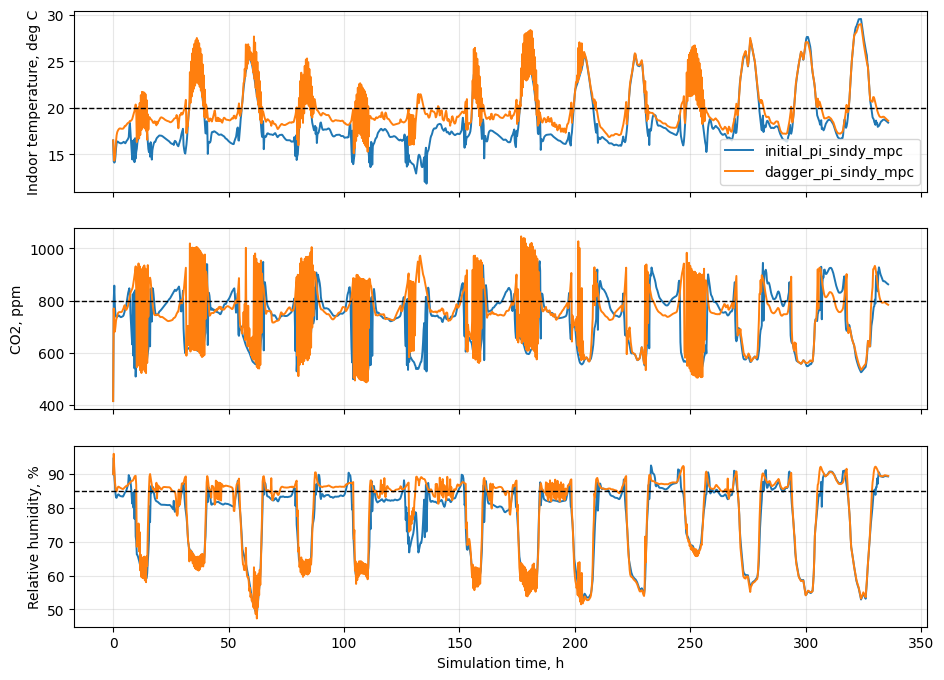

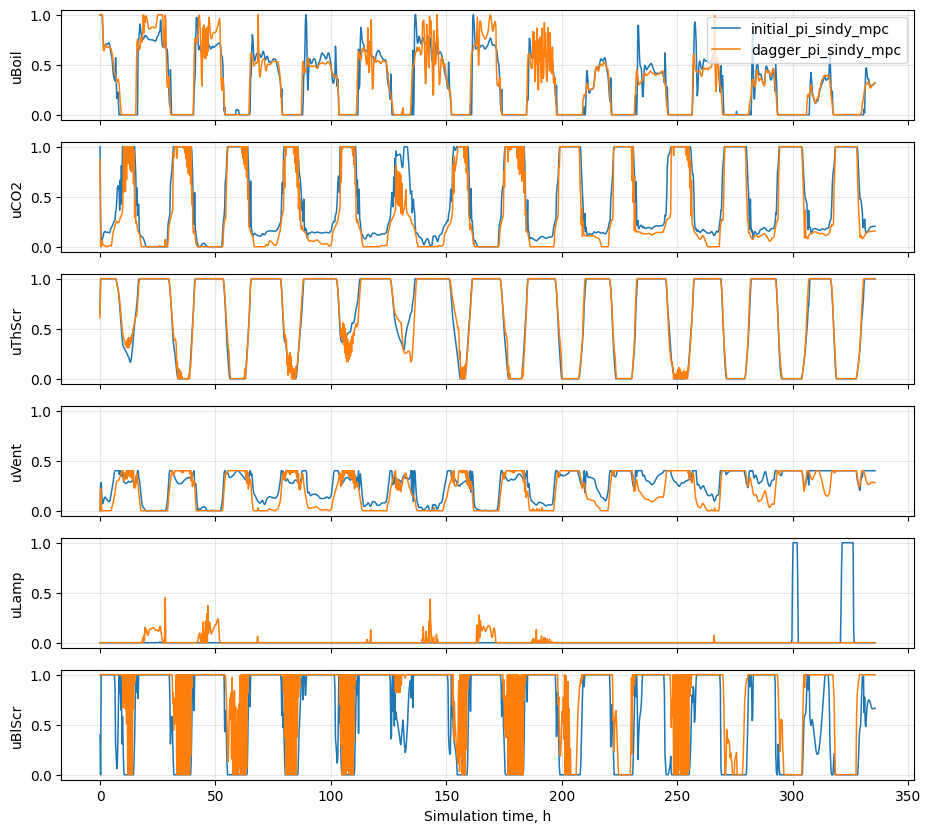

In [5]:
# Optional closed-loop check for the final DAgger bundle.
rollout_days = 1 if FAST_MODE else 14
final_bundle = dagger_bundles[-1]
initial_bundle = dagger_bundles[0]

rollouts = {
    'initial_pi_sindy_mpc': rollout_mpc(initial_bundle, cfg, n_days=rollout_days, start_date='2010-04-15'),
    'dagger_pi_sindy_mpc': rollout_mpc(final_bundle, cfg, n_days=rollout_days, start_date='2010-04-15'),
}
closed_loop = benchmark_rollouts(rollouts)
save_table(closed_loop, OUT / 'tables' / ('dagger_closed_loop_fast.csv' if FAST_MODE else 'dagger_closed_loop.csv'))
plot_rollout_comparison(rollouts, OUT / 'figures', suffix='_dagger_fast' if FAST_MODE else '_dagger')
closed_loop